# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [13]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [14]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

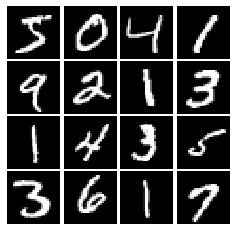

In [15]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [16]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return -alpha * tf.maximum(0, -x) + tf.maximum(x, 0)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [17]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [63]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform([batch_size, dim], minval = -1, maxval = 1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [64]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [65]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(256, input_shape = (784,), activation = tf.keras.layers.LeakyReLU(alpha=0.01)),
        tf.keras.layers.Dense(256, activation = tf.keras.layers.LeakyReLU(alpha=0.01)),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [66]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [67]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, input_shape =(noise_dim,), activation = tf.keras.activations.relu),
        tf.keras.layers.Dense(1024, activation = tf.keras.activations.relu),
        tf.keras.layers.Dense(784, activation = tf.keras.activations.tanh)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [68]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [69]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    first_term = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones(tf.shape(logits_real)), logits_real)
    second_term = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.zeros(tf.shape(logits_fake)), logits_fake)
    loss = first_term+second_term
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones(tf.shape(logits_fake)), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [70]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [71]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [72]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.optimizers.Adam(learning_rate = learning_rate, beta_1=beta1)
    G_solver = tf.optimizers.Adam(learning_rate = learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [73]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 2.046, G:0.7094


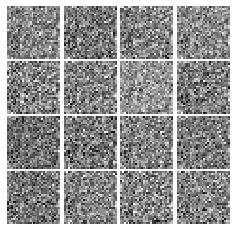

Epoch: 0, Iter: 20, D: 0.5382, G:1.088


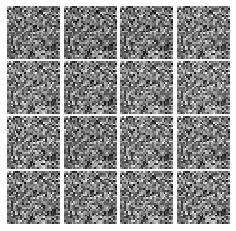

Epoch: 0, Iter: 40, D: 0.5499, G:0.9634


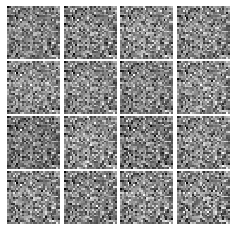

Epoch: 0, Iter: 60, D: 0.2647, G:2.26


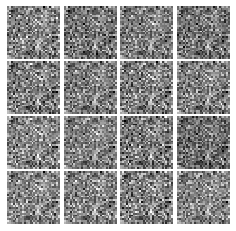

Epoch: 0, Iter: 80, D: 1.122, G:2.247


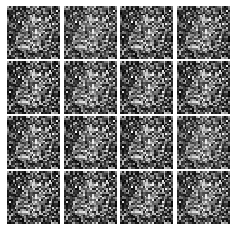

Epoch: 0, Iter: 100, D: 0.5017, G:1.544


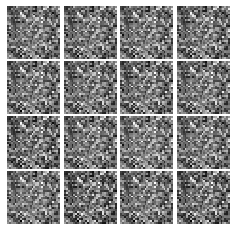

Epoch: 0, Iter: 120, D: 1.332, G:1.212


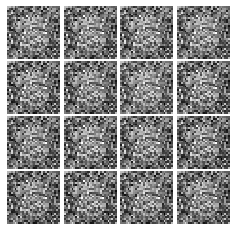

Epoch: 0, Iter: 140, D: 1.389, G:1.698


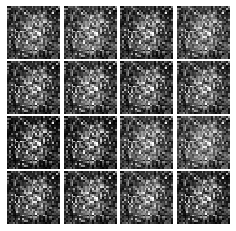

Epoch: 0, Iter: 160, D: 1.139, G:1.404


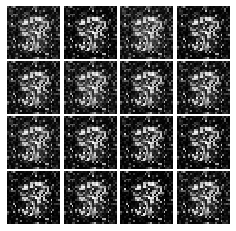

Epoch: 0, Iter: 180, D: 1.825, G:0.8111


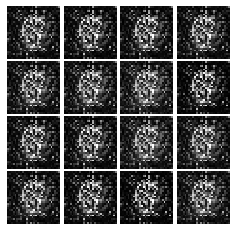

Epoch: 0, Iter: 200, D: 1.265, G:0.7654


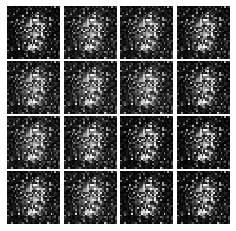

Epoch: 0, Iter: 220, D: 0.9342, G:1.6


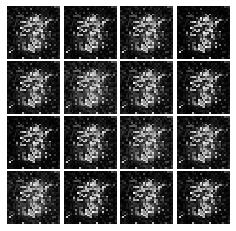

Epoch: 0, Iter: 240, D: 1.075, G:1.095


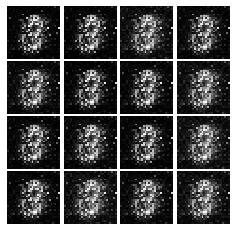

Epoch: 0, Iter: 260, D: 1.503, G:0.9278


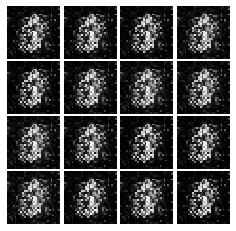

Epoch: 0, Iter: 280, D: 1.749, G:0.7493


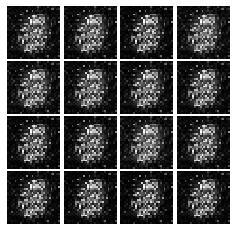

Epoch: 0, Iter: 300, D: 2.192, G:2.202


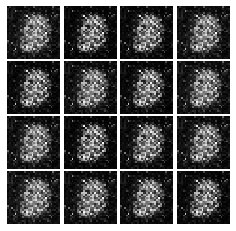

Epoch: 0, Iter: 320, D: 1.097, G:0.945


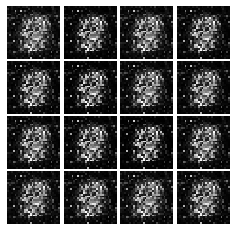

Epoch: 0, Iter: 340, D: 1.263, G:1.63


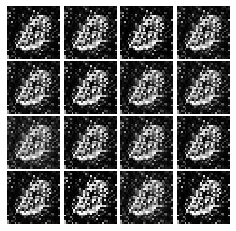

Epoch: 0, Iter: 360, D: 1.491, G:0.7496


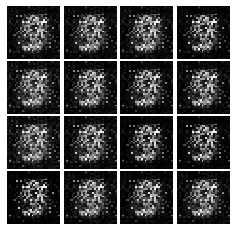

Epoch: 0, Iter: 380, D: 1.055, G:2.13


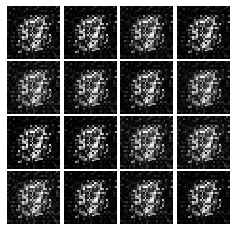

Epoch: 0, Iter: 400, D: 1.412, G:0.8337


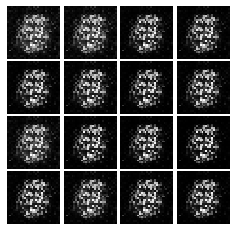

Epoch: 0, Iter: 420, D: 1.572, G:1.429


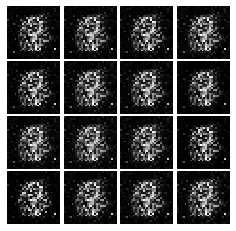

Epoch: 0, Iter: 440, D: 1.468, G:0.9002


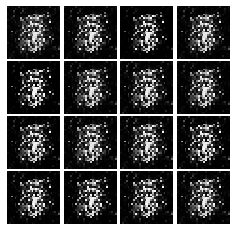

Epoch: 0, Iter: 460, D: 1.114, G:1.157


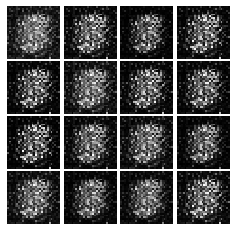

Epoch: 1, Iter: 480, D: 1.71, G:1.181


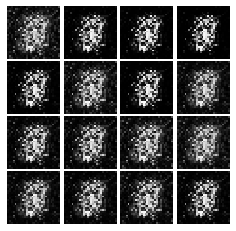

Epoch: 1, Iter: 500, D: 1.391, G:0.6714


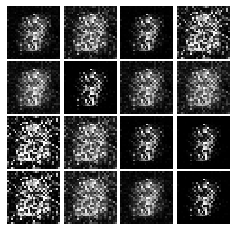

Epoch: 1, Iter: 520, D: 1.057, G:1.052


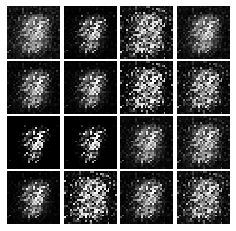

Epoch: 1, Iter: 540, D: 1.395, G:0.9678


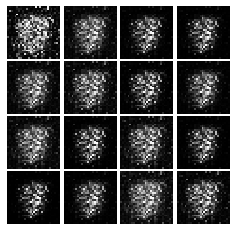

Epoch: 1, Iter: 560, D: 1.308, G:1.037


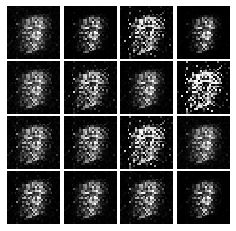

Epoch: 1, Iter: 580, D: 1.326, G:1.212


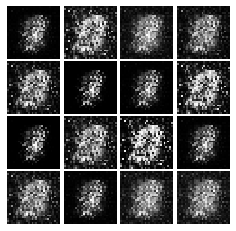

Epoch: 1, Iter: 600, D: 1.113, G:3.184


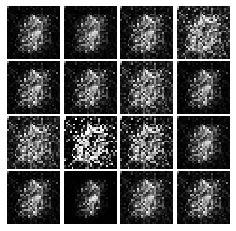

Epoch: 1, Iter: 620, D: 1.203, G:1.451


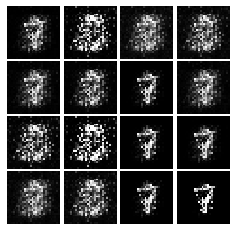

Epoch: 1, Iter: 640, D: 1.285, G:0.5402


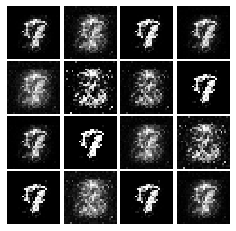

Epoch: 1, Iter: 660, D: 1.308, G:1.22


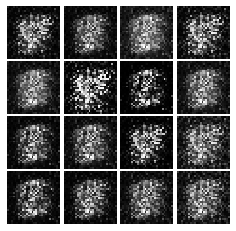

Epoch: 1, Iter: 680, D: 1.297, G:1.959


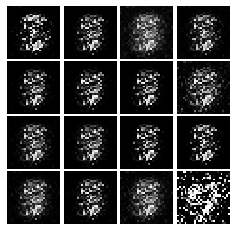

Epoch: 1, Iter: 700, D: 1.165, G:1.469


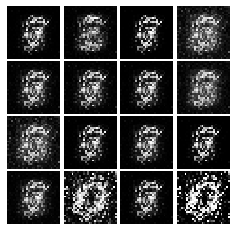

Epoch: 1, Iter: 720, D: 1.042, G:1.275


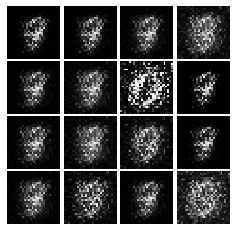

Epoch: 1, Iter: 740, D: 1.629, G:1.699


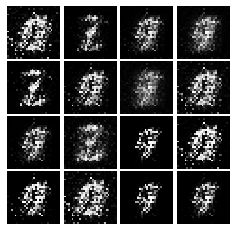

Epoch: 1, Iter: 760, D: 1.158, G:2.023


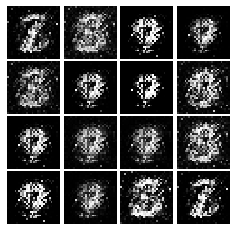

Epoch: 1, Iter: 780, D: 1.342, G:1.017


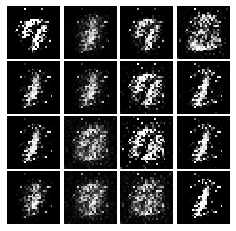

Epoch: 1, Iter: 800, D: 1.212, G:1.143


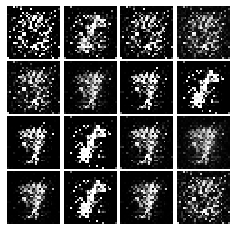

Epoch: 1, Iter: 820, D: 1.199, G:1.24


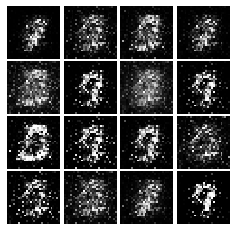

Epoch: 1, Iter: 840, D: 1.119, G:1.359


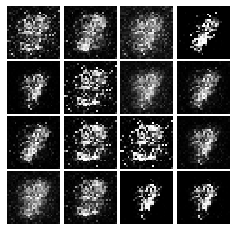

Epoch: 1, Iter: 860, D: 1.491, G:1.135


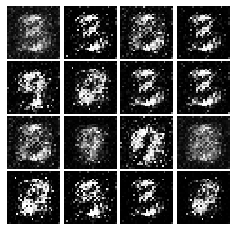

Epoch: 1, Iter: 880, D: 1.151, G:1.835


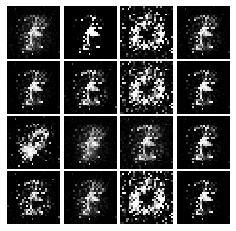

Epoch: 1, Iter: 900, D: 1.182, G:2.012


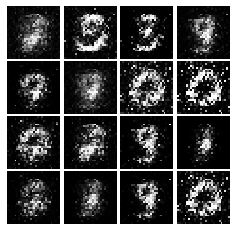

Epoch: 1, Iter: 920, D: 1.111, G:1.06


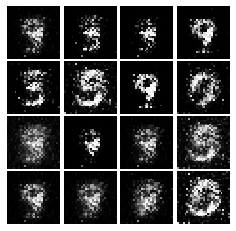

Epoch: 2, Iter: 940, D: 1.25, G:1.147


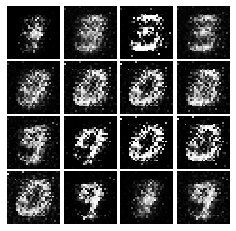

Epoch: 2, Iter: 960, D: 1.18, G:1.039


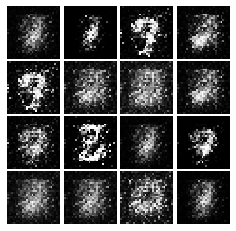

Epoch: 2, Iter: 980, D: 1.436, G:0.6171


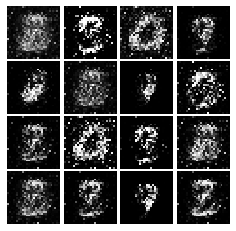

Epoch: 2, Iter: 1000, D: 1.041, G:1.123


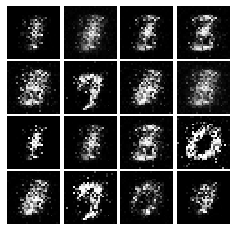

Epoch: 2, Iter: 1020, D: 1.041, G:1.189


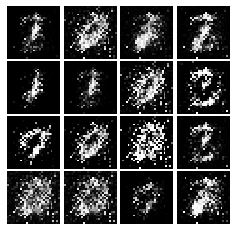

Epoch: 2, Iter: 1040, D: 1.295, G:0.9817


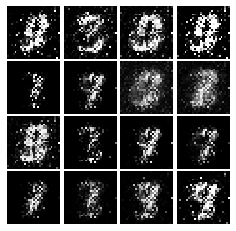

Epoch: 2, Iter: 1060, D: 1.003, G:0.9236


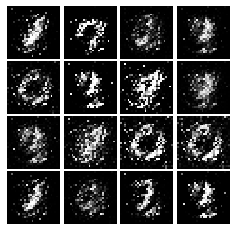

Epoch: 2, Iter: 1080, D: 1.167, G:0.6906


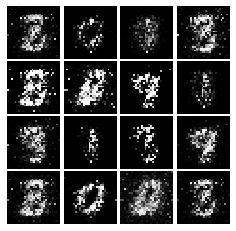

Epoch: 2, Iter: 1100, D: 1.005, G:1.445


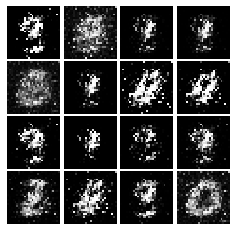

Epoch: 2, Iter: 1120, D: 1.089, G:1.464


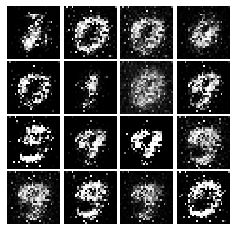

Epoch: 2, Iter: 1140, D: 1.06, G:1.162


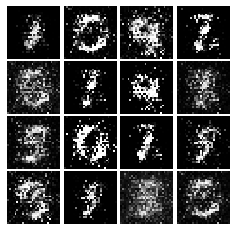

Epoch: 2, Iter: 1160, D: 1.126, G:1.086


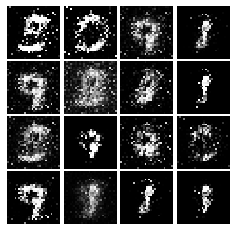

Epoch: 2, Iter: 1180, D: 1.163, G:0.8769


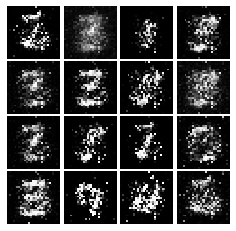

Epoch: 2, Iter: 1200, D: 1.126, G:1.248


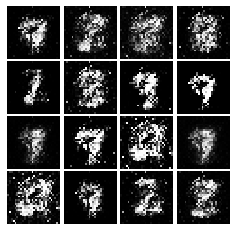

Epoch: 2, Iter: 1220, D: 1.145, G:1.094


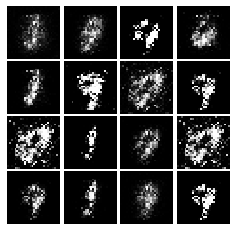

Epoch: 2, Iter: 1240, D: 1.1, G:1.194


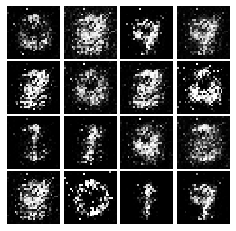

Epoch: 2, Iter: 1260, D: 1.179, G:0.9926


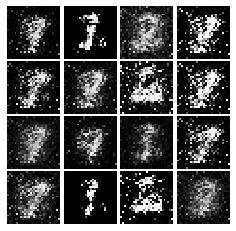

Epoch: 2, Iter: 1280, D: 1.165, G:3.262


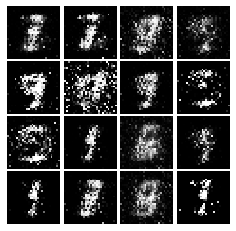

Epoch: 2, Iter: 1300, D: 1.02, G:1.309


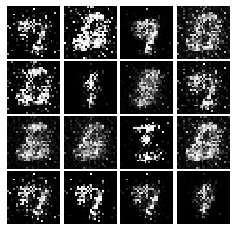

Epoch: 2, Iter: 1320, D: 1.352, G:0.9066


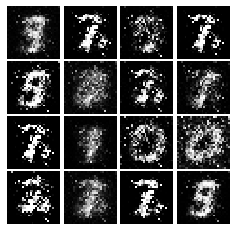

Epoch: 2, Iter: 1340, D: 1.239, G:0.917


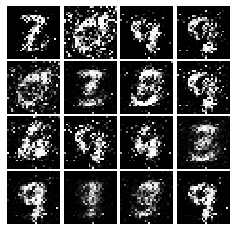

Epoch: 2, Iter: 1360, D: 1.256, G:1.044


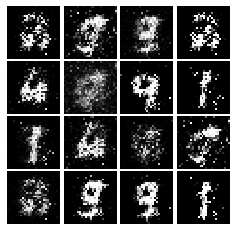

Epoch: 2, Iter: 1380, D: 2.217, G:0.3142


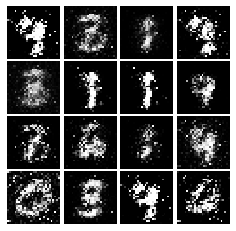

Epoch: 2, Iter: 1400, D: 1.27, G:0.8602


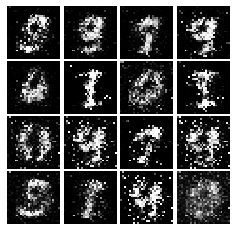

Epoch: 3, Iter: 1420, D: 1.234, G:0.8456


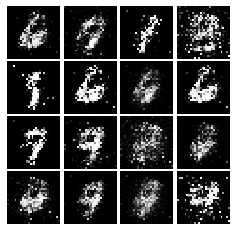

Epoch: 3, Iter: 1440, D: 1.425, G:0.784


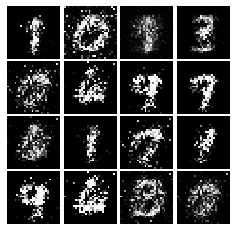

Epoch: 3, Iter: 1460, D: 1.422, G:0.8112


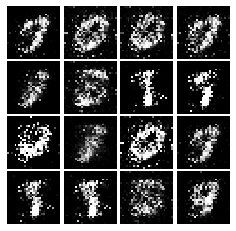

Epoch: 3, Iter: 1480, D: 1.206, G:1.055


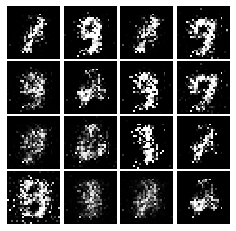

Epoch: 3, Iter: 1500, D: 1.337, G:0.9267


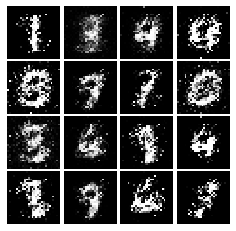

Epoch: 3, Iter: 1520, D: 1.272, G:0.7723


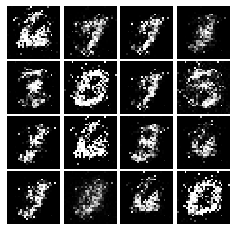

Epoch: 3, Iter: 1540, D: 1.22, G:0.928


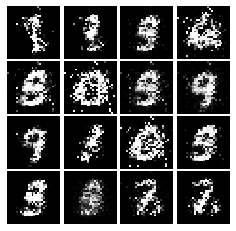

Epoch: 3, Iter: 1560, D: 1.104, G:1.169


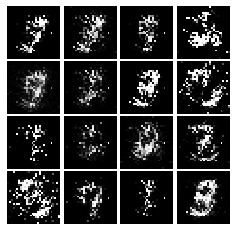

Epoch: 3, Iter: 1580, D: 1.451, G:0.8292


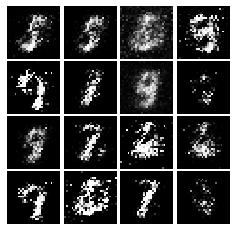

Epoch: 3, Iter: 1600, D: 1.268, G:0.9095


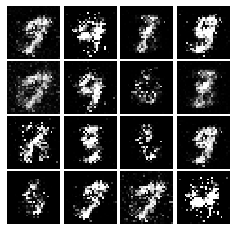

Epoch: 3, Iter: 1620, D: 0.9374, G:1.296


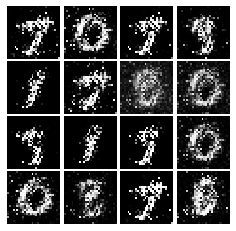

Epoch: 3, Iter: 1640, D: 1.129, G:1.289


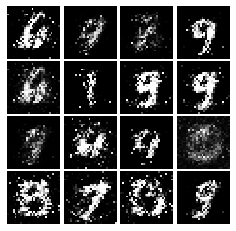

Epoch: 3, Iter: 1660, D: 1.171, G:1.065


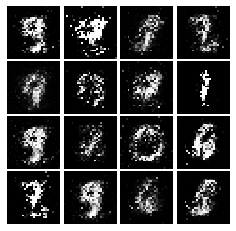

Epoch: 3, Iter: 1680, D: 1.121, G:1.041


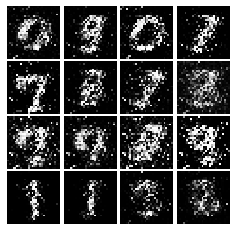

Epoch: 3, Iter: 1700, D: 1.113, G:1.048


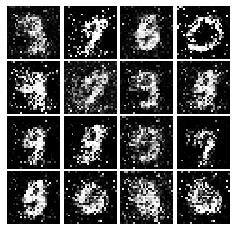

Epoch: 3, Iter: 1720, D: 1.245, G:0.9342


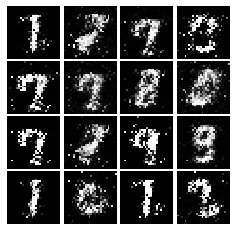

Epoch: 3, Iter: 1740, D: 1.195, G:1.04


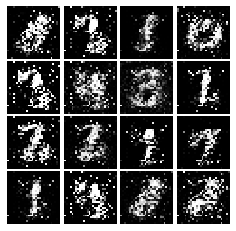

Epoch: 3, Iter: 1760, D: 1.227, G:0.9541


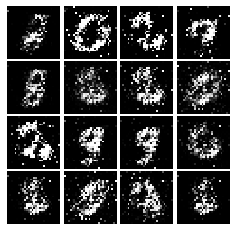

Epoch: 3, Iter: 1780, D: 1.154, G:1.198


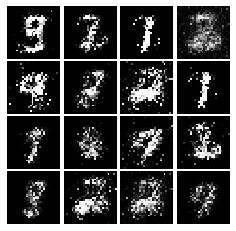

Epoch: 3, Iter: 1800, D: 1.224, G:1.7


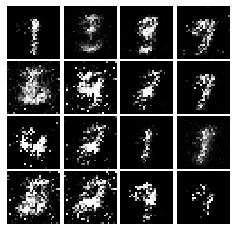

Epoch: 3, Iter: 1820, D: 1.376, G:0.8846


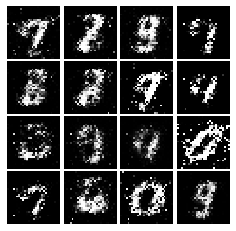

Epoch: 3, Iter: 1840, D: 1.245, G:1.05


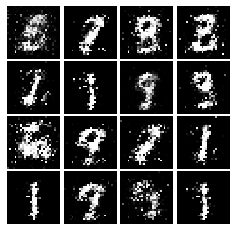

Epoch: 3, Iter: 1860, D: 1.228, G:0.9733


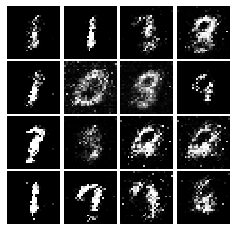

Epoch: 4, Iter: 1880, D: 1.148, G:0.9336


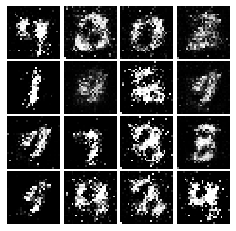

Epoch: 4, Iter: 1900, D: 1.324, G:1.089


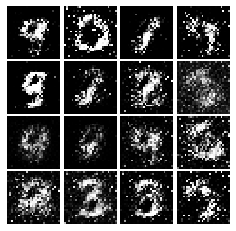

Epoch: 4, Iter: 1920, D: 1.079, G:1.427


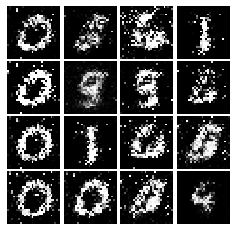

Epoch: 4, Iter: 1940, D: 1.28, G:0.9967


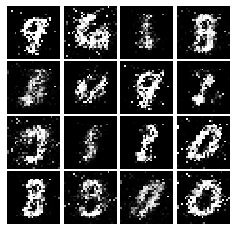

Epoch: 4, Iter: 1960, D: 1.349, G:0.7728


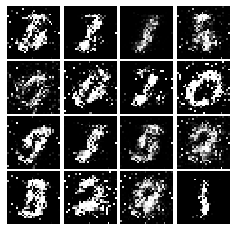

Epoch: 4, Iter: 1980, D: 1.351, G:0.921


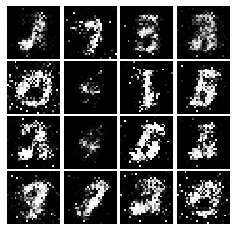

Epoch: 4, Iter: 2000, D: 1.352, G:0.9992


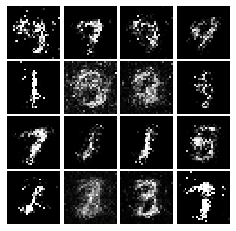

Epoch: 4, Iter: 2020, D: 1.201, G:0.8897


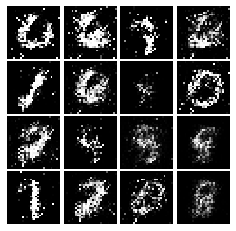

Epoch: 4, Iter: 2040, D: 1.327, G:2.675


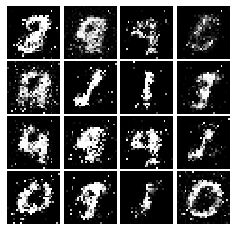

Epoch: 4, Iter: 2060, D: 1.395, G:0.8804


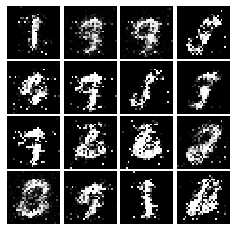

Epoch: 4, Iter: 2080, D: 1.151, G:0.4316


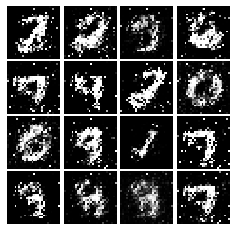

Epoch: 4, Iter: 2100, D: 1.248, G:1.04


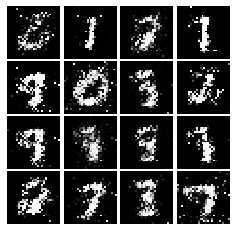

Epoch: 4, Iter: 2120, D: 1.282, G:0.9479


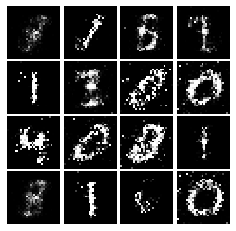

Epoch: 4, Iter: 2140, D: 1.24, G:1.087


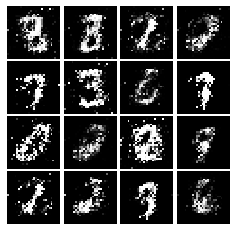

Epoch: 4, Iter: 2160, D: 1.21, G:0.8051


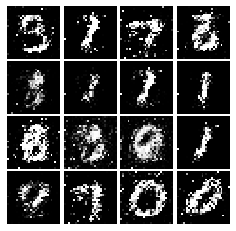

Epoch: 4, Iter: 2180, D: 1.278, G:0.9312


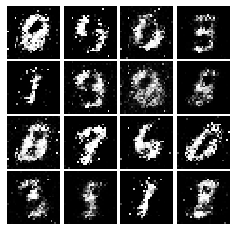

Epoch: 4, Iter: 2200, D: 1.164, G:1.013


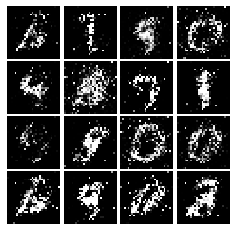

Epoch: 4, Iter: 2220, D: 1.099, G:1.193


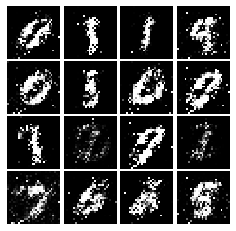

Epoch: 4, Iter: 2240, D: 1.296, G:1.049


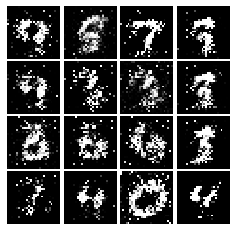

Epoch: 4, Iter: 2260, D: 1.242, G:0.8402


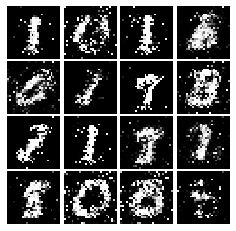

Epoch: 4, Iter: 2280, D: 1.156, G:0.9832


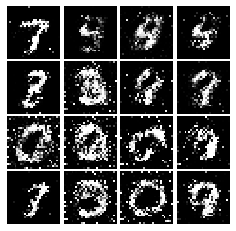

Epoch: 4, Iter: 2300, D: 1.257, G:0.9251


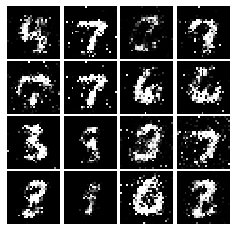

Epoch: 4, Iter: 2320, D: 1.182, G:1.032


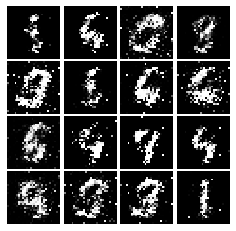

Epoch: 4, Iter: 2340, D: 1.217, G:1.266


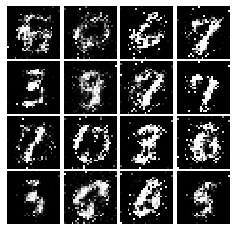

Epoch: 5, Iter: 2360, D: 1.118, G:0.6943


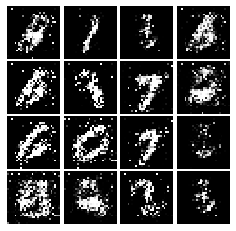

Epoch: 5, Iter: 2380, D: 1.216, G:1.129


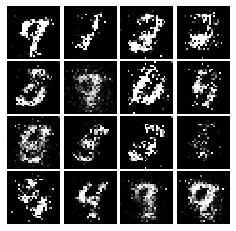

Epoch: 5, Iter: 2400, D: 1.725, G:0.6413


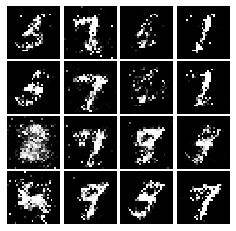

Epoch: 5, Iter: 2420, D: 1.146, G:1.218


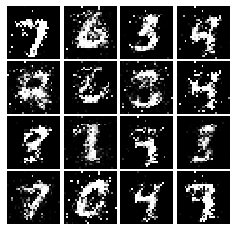

Epoch: 5, Iter: 2440, D: 1.198, G:0.9813


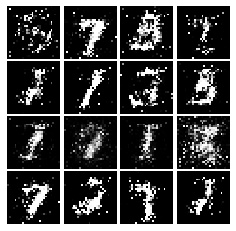

Epoch: 5, Iter: 2460, D: 1.252, G:0.9598


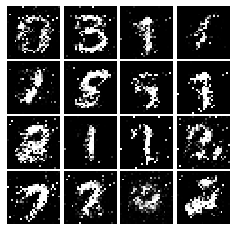

Epoch: 5, Iter: 2480, D: 1.117, G:0.9657


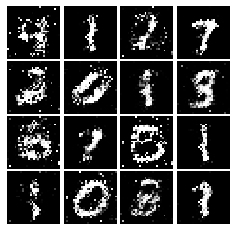

Epoch: 5, Iter: 2500, D: 1.124, G:1.028


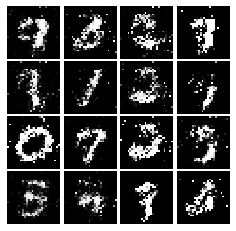

Epoch: 5, Iter: 2520, D: 1.421, G:0.8614


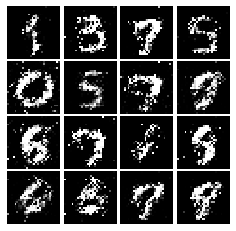

Epoch: 5, Iter: 2540, D: 1.296, G:0.7694


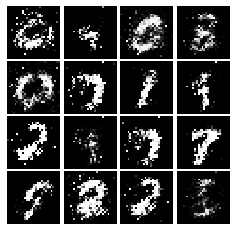

Epoch: 5, Iter: 2560, D: 1.267, G:0.9396


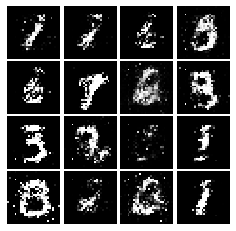

Epoch: 5, Iter: 2580, D: 1.293, G:0.8995


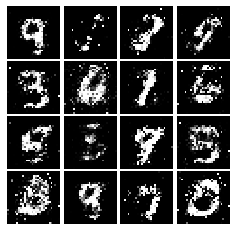

Epoch: 5, Iter: 2600, D: 1.512, G:0.7196


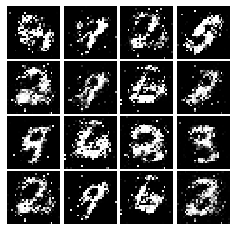

Epoch: 5, Iter: 2620, D: 1.254, G:0.9169


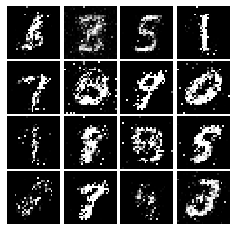

Epoch: 5, Iter: 2640, D: 1.229, G:0.8643


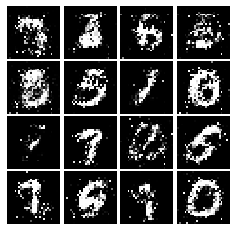

Epoch: 5, Iter: 2660, D: 1.346, G:1.04


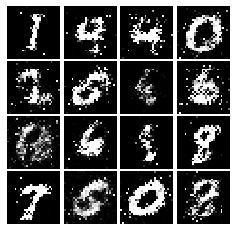

Epoch: 5, Iter: 2680, D: 1.372, G:0.7414


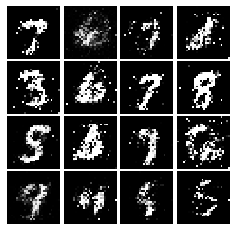

Epoch: 5, Iter: 2700, D: 1.347, G:0.8865


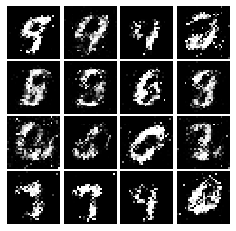

Epoch: 5, Iter: 2720, D: 1.335, G:0.8841


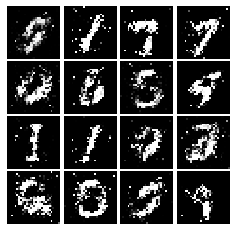

Epoch: 5, Iter: 2740, D: 1.299, G:0.9307


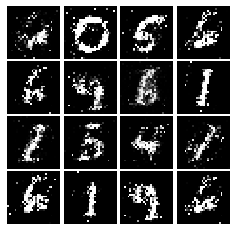

Epoch: 5, Iter: 2760, D: 1.311, G:0.9318


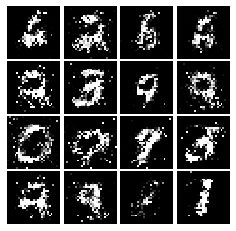

Epoch: 5, Iter: 2780, D: 1.251, G:0.8439


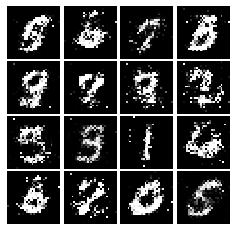

Epoch: 5, Iter: 2800, D: 1.295, G:0.8442


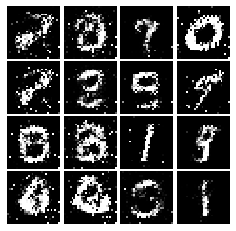

Epoch: 6, Iter: 2820, D: 1.333, G:0.7538


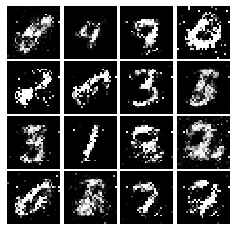

Epoch: 6, Iter: 2840, D: 1.297, G:0.8693


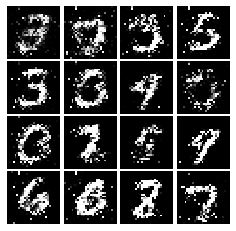

Epoch: 6, Iter: 2860, D: 1.272, G:0.8775


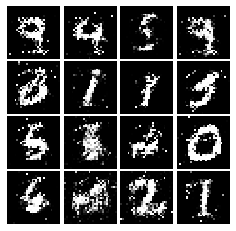

Epoch: 6, Iter: 2880, D: 1.274, G:0.9296


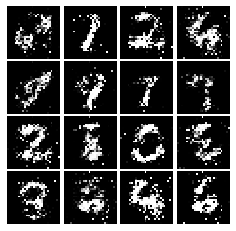

Epoch: 6, Iter: 2900, D: 1.355, G:0.8567


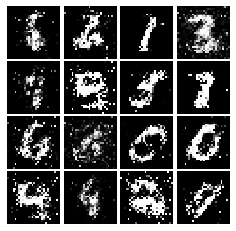

Epoch: 6, Iter: 2920, D: 1.405, G:0.9066


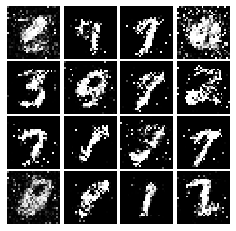

Epoch: 6, Iter: 2940, D: 1.274, G:0.9378


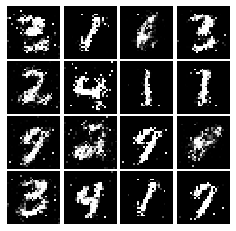

Epoch: 6, Iter: 2960, D: 1.333, G:0.8346


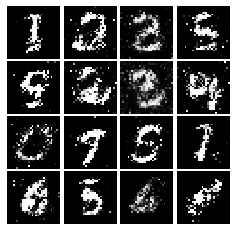

Epoch: 6, Iter: 2980, D: 1.29, G:0.79


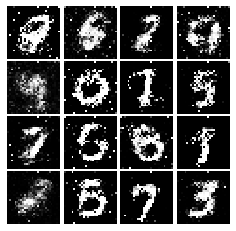

Epoch: 6, Iter: 3000, D: 1.317, G:0.7524


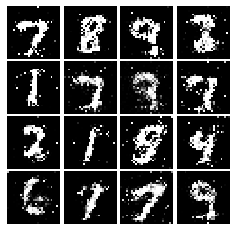

Epoch: 6, Iter: 3020, D: 1.402, G:0.7321


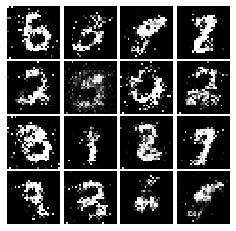

Epoch: 6, Iter: 3040, D: 1.307, G:0.9926


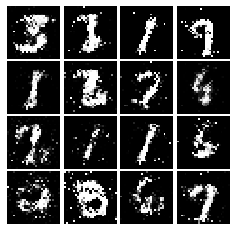

Epoch: 6, Iter: 3060, D: 1.324, G:0.8056


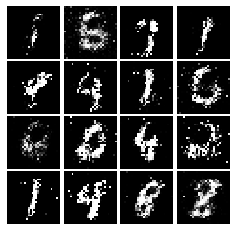

Epoch: 6, Iter: 3080, D: 1.419, G:0.8227


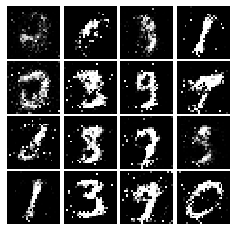

Epoch: 6, Iter: 3100, D: 1.22, G:0.9617


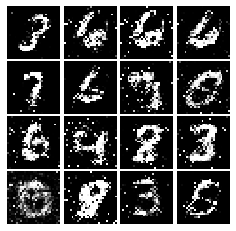

Epoch: 6, Iter: 3120, D: 1.255, G:0.865


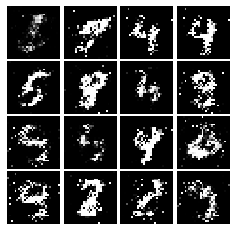

Epoch: 6, Iter: 3140, D: 1.418, G:0.8067


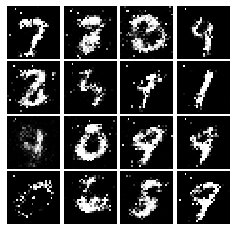

Epoch: 6, Iter: 3160, D: 1.325, G:0.8396


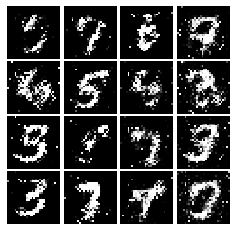

Epoch: 6, Iter: 3180, D: 1.278, G:0.7896


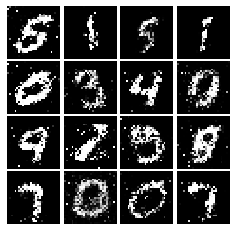

Epoch: 6, Iter: 3200, D: 1.196, G:0.8512


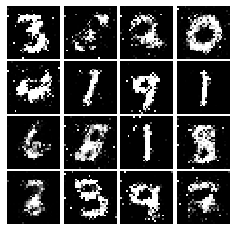

Epoch: 6, Iter: 3220, D: 1.296, G:0.8789


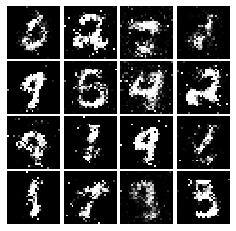

Epoch: 6, Iter: 3240, D: 1.319, G:0.8569


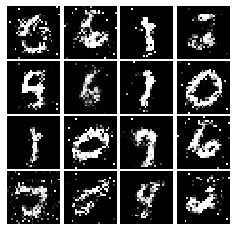

Epoch: 6, Iter: 3260, D: 1.414, G:0.7909


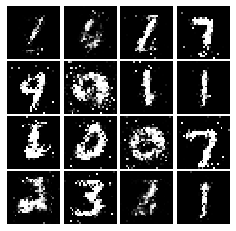

Epoch: 6, Iter: 3280, D: 1.318, G:0.8269


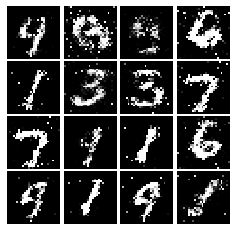

Epoch: 7, Iter: 3300, D: 1.207, G:0.8684


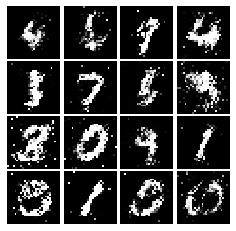

Epoch: 7, Iter: 3320, D: 1.299, G:0.8261


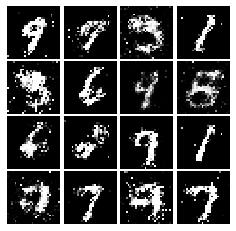

Epoch: 7, Iter: 3340, D: 1.323, G:0.7006


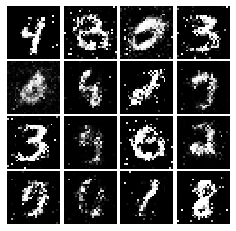

Epoch: 7, Iter: 3360, D: 1.43, G:0.9014


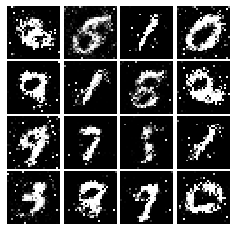

Epoch: 7, Iter: 3380, D: 1.372, G:0.8692


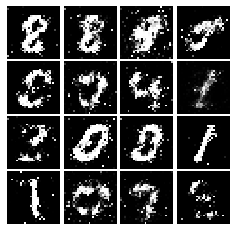

Epoch: 7, Iter: 3400, D: 1.47, G:0.7833


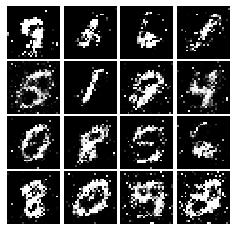

Epoch: 7, Iter: 3420, D: 1.312, G:0.8182


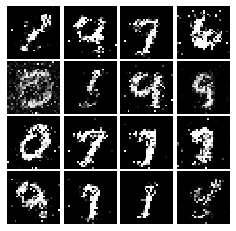

Epoch: 7, Iter: 3440, D: 1.314, G:0.8659


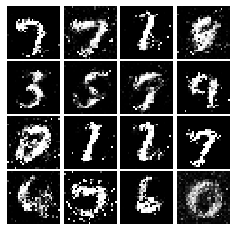

Epoch: 7, Iter: 3460, D: 1.196, G:0.8496


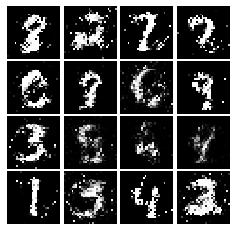

Epoch: 7, Iter: 3480, D: 1.312, G:0.7905


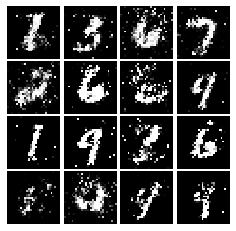

Epoch: 7, Iter: 3500, D: 1.253, G:0.8685


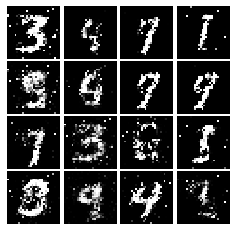

Epoch: 7, Iter: 3520, D: 1.268, G:0.8615


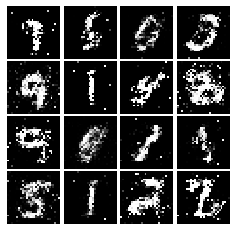

Epoch: 7, Iter: 3540, D: 1.153, G:0.8221


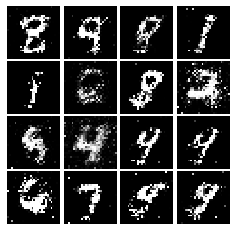

Epoch: 7, Iter: 3560, D: 1.304, G:0.8996


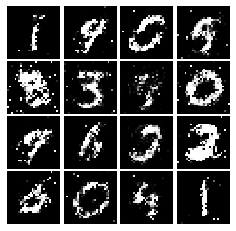

Epoch: 7, Iter: 3580, D: 1.386, G:0.7926


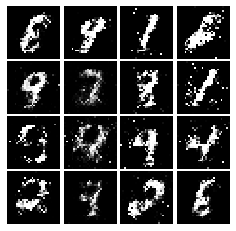

Epoch: 7, Iter: 3600, D: 1.307, G:0.8393


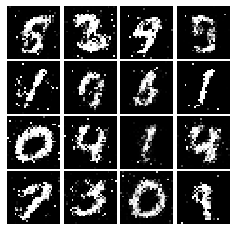

Epoch: 7, Iter: 3620, D: 1.293, G:0.8023


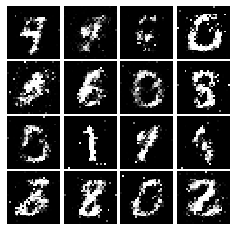

Epoch: 7, Iter: 3640, D: 1.331, G:0.7685


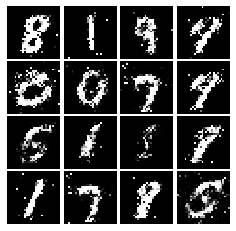

Epoch: 7, Iter: 3660, D: 1.319, G:0.7421


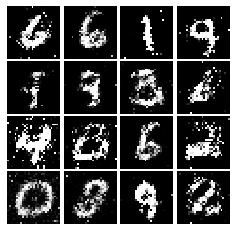

Epoch: 7, Iter: 3680, D: 1.317, G:0.8603


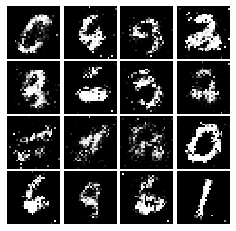

Epoch: 7, Iter: 3700, D: 1.329, G:1.129


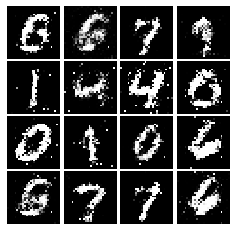

Epoch: 7, Iter: 3720, D: 1.337, G:0.9274


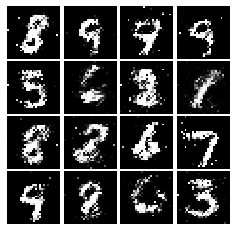

Epoch: 7, Iter: 3740, D: 1.376, G:0.6887


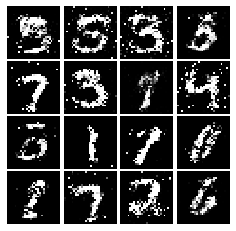

Epoch: 8, Iter: 3760, D: 1.416, G:0.9051


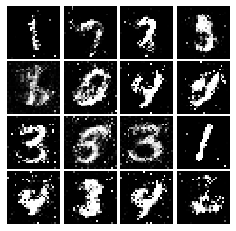

Epoch: 8, Iter: 3780, D: 1.241, G:0.9802


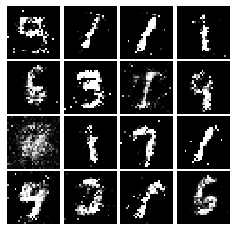

Epoch: 8, Iter: 3800, D: 1.326, G:0.8401


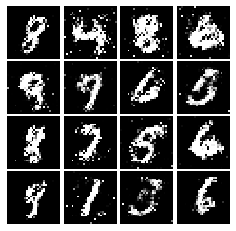

Epoch: 8, Iter: 3820, D: 1.297, G:1.025


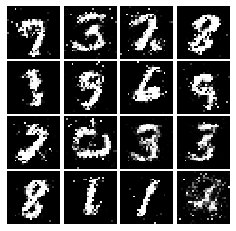

Epoch: 8, Iter: 3840, D: 1.335, G:0.822


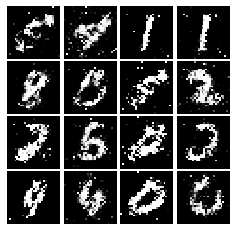

Epoch: 8, Iter: 3860, D: 1.247, G:0.7656


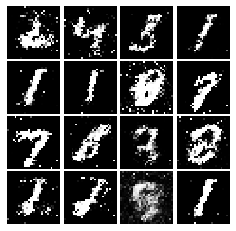

Epoch: 8, Iter: 3880, D: 1.323, G:0.7724


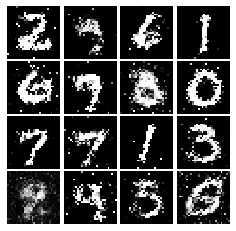

Epoch: 8, Iter: 3900, D: 1.4, G:0.7787


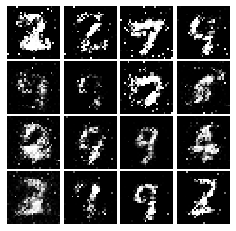

Epoch: 8, Iter: 3920, D: 1.265, G:0.8065


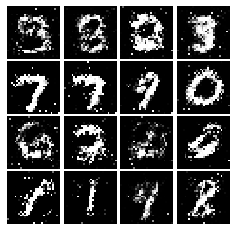

Epoch: 8, Iter: 3940, D: 1.34, G:0.8245


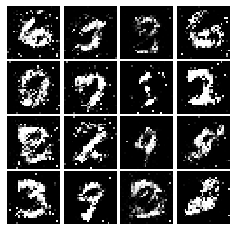

Epoch: 8, Iter: 3960, D: 1.31, G:0.9344


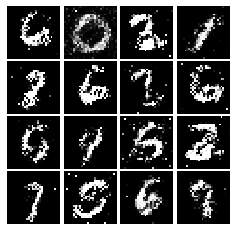

Epoch: 8, Iter: 3980, D: 1.394, G:0.9683


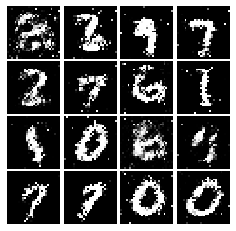

Epoch: 8, Iter: 4000, D: 1.245, G:0.9173


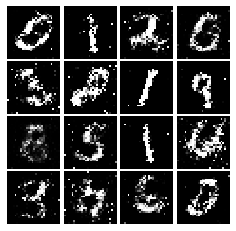

Epoch: 8, Iter: 4020, D: 1.275, G:1.137


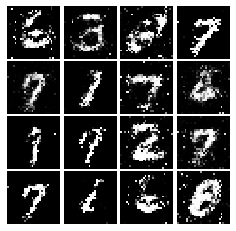

Epoch: 8, Iter: 4040, D: 1.252, G:0.8209


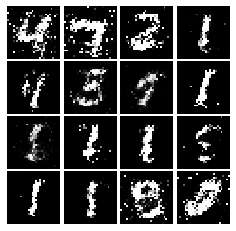

Epoch: 8, Iter: 4060, D: 1.326, G:1.02


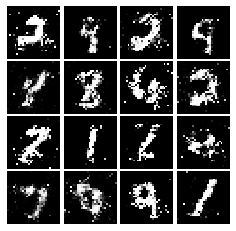

Epoch: 8, Iter: 4080, D: 1.336, G:0.8116


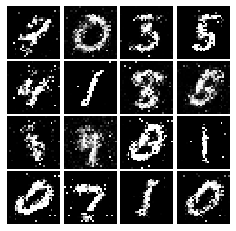

Epoch: 8, Iter: 4100, D: 1.332, G:0.8456


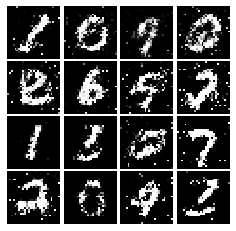

Epoch: 8, Iter: 4120, D: 1.375, G:0.7391


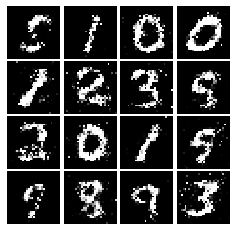

Epoch: 8, Iter: 4140, D: 1.381, G:0.8278


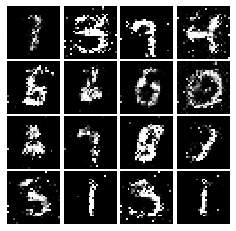

Epoch: 8, Iter: 4160, D: 1.3, G:0.8737


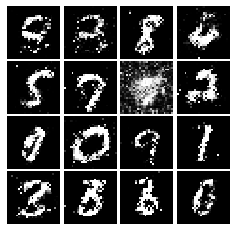

Epoch: 8, Iter: 4180, D: 1.326, G:0.805


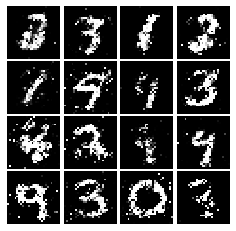

Epoch: 8, Iter: 4200, D: 1.344, G:0.9254


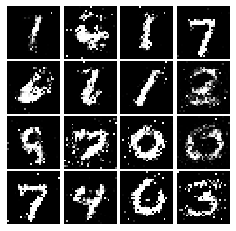

Epoch: 8, Iter: 4220, D: 1.307, G:0.8972


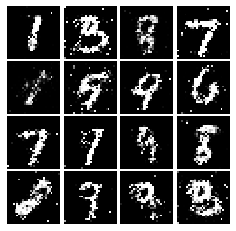

Epoch: 9, Iter: 4240, D: 1.38, G:0.8217


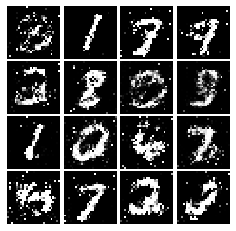

Epoch: 9, Iter: 4260, D: 1.392, G:0.7495


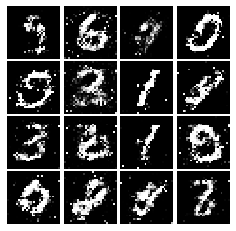

Epoch: 9, Iter: 4280, D: 1.457, G:0.7413


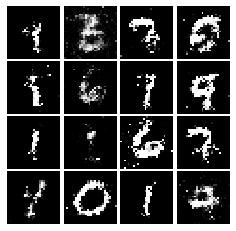

Epoch: 9, Iter: 4300, D: 1.471, G:1.035


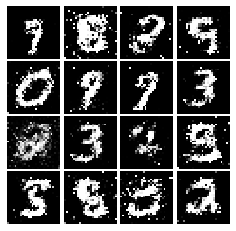

Epoch: 9, Iter: 4320, D: 1.312, G:0.8085


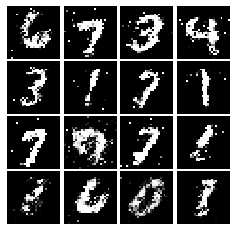

Epoch: 9, Iter: 4340, D: 1.326, G:0.7862


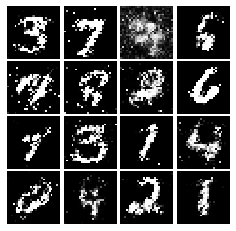

Epoch: 9, Iter: 4360, D: 1.409, G:0.794


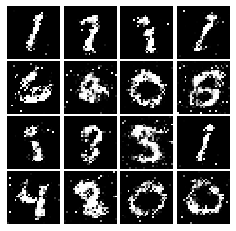

Epoch: 9, Iter: 4380, D: 1.427, G:0.7998


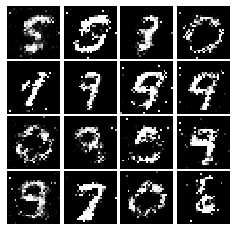

Epoch: 9, Iter: 4400, D: 1.306, G:0.7135


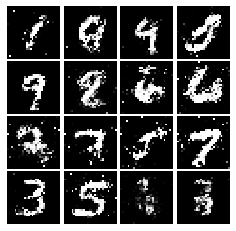

Epoch: 9, Iter: 4420, D: 1.373, G:0.7816


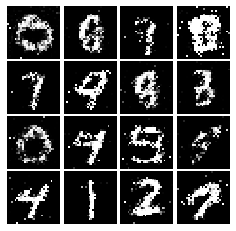

Epoch: 9, Iter: 4440, D: 1.326, G:0.8123


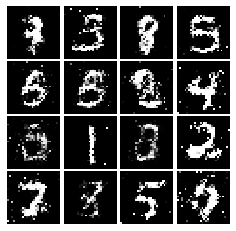

Epoch: 9, Iter: 4460, D: 1.338, G:0.7992


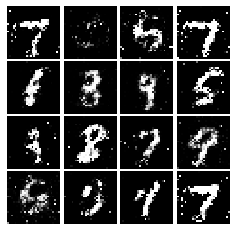

Epoch: 9, Iter: 4480, D: 1.292, G:0.8249


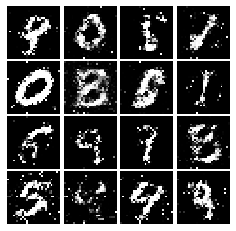

Epoch: 9, Iter: 4500, D: 1.419, G:0.7771


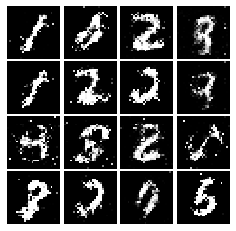

Epoch: 9, Iter: 4520, D: 1.343, G:0.8289


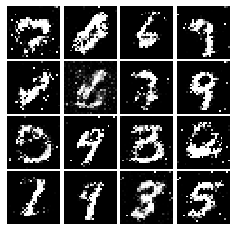

Epoch: 9, Iter: 4540, D: 1.319, G:0.8923


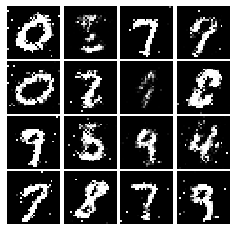

Epoch: 9, Iter: 4560, D: 1.39, G:0.7373


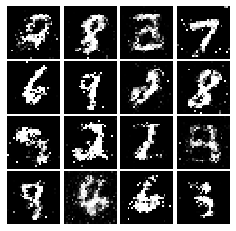

Epoch: 9, Iter: 4580, D: 1.359, G:0.7545


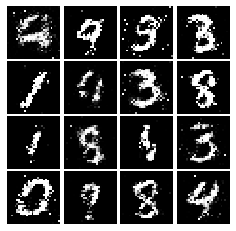

Epoch: 9, Iter: 4600, D: 1.365, G:0.8426


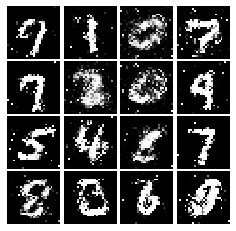

Epoch: 9, Iter: 4620, D: 1.285, G:0.8676


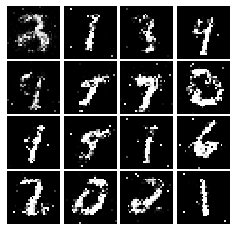

Epoch: 9, Iter: 4640, D: 1.382, G:0.6605


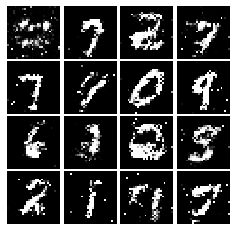

Epoch: 9, Iter: 4660, D: 1.376, G:0.6979


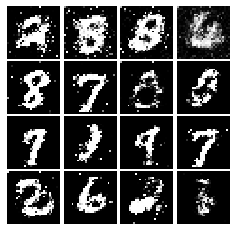

Epoch: 9, Iter: 4680, D: 1.268, G:0.8138


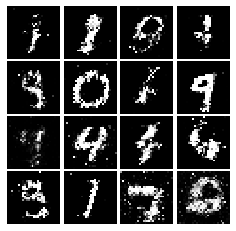

Final images


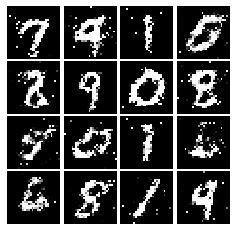

In [74]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [79]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 1/2 * tf.reduce_mean((scores_real-1)**2) + 1/2 * tf.reduce_mean(scores_fake**2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 1/2 * tf.reduce_mean((scores_fake-1)**2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [80]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 2.254, G:0.4648


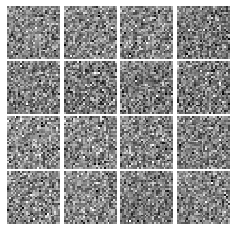

Epoch: 0, Iter: 20, D: 0.03779, G:0.9089


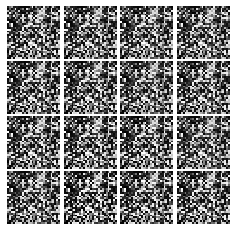

Epoch: 0, Iter: 40, D: 0.1394, G:0.8887


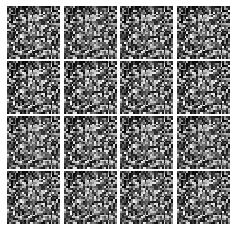

Epoch: 0, Iter: 60, D: 0.04198, G:0.8876


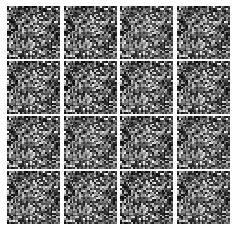

Epoch: 0, Iter: 80, D: 0.04255, G:0.5743


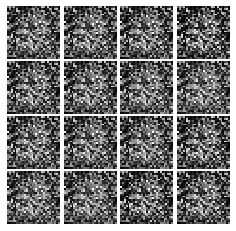

Epoch: 0, Iter: 100, D: 0.02578, G:0.7577


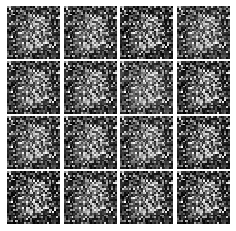

Epoch: 0, Iter: 120, D: 0.3561, G:0.05341


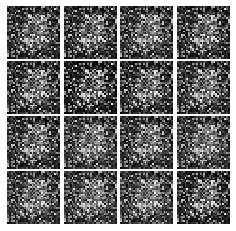

Epoch: 0, Iter: 140, D: 0.05672, G:0.6703


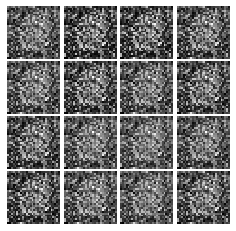

Epoch: 0, Iter: 160, D: 0.05036, G:0.3156


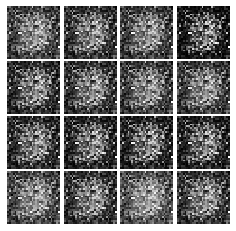

Epoch: 0, Iter: 180, D: 0.1492, G:0.6751


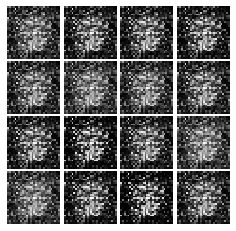

Epoch: 0, Iter: 200, D: 0.1791, G:0.2964


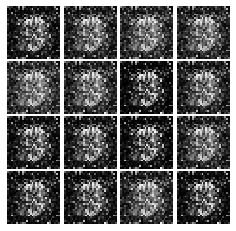

Epoch: 0, Iter: 220, D: 0.09307, G:0.3603


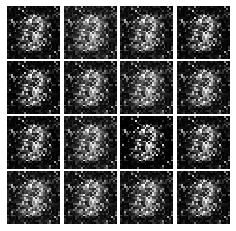

Epoch: 0, Iter: 240, D: 0.2059, G:0.07323


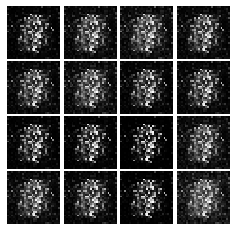

Epoch: 0, Iter: 260, D: 0.2224, G:0.1475


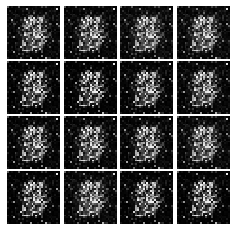

Epoch: 0, Iter: 280, D: 0.1046, G:0.3025


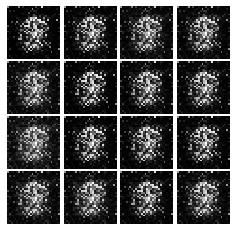

Epoch: 0, Iter: 300, D: 0.07894, G:0.4911


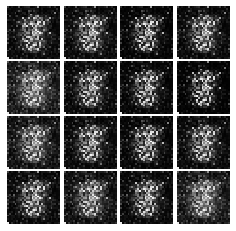

Epoch: 0, Iter: 320, D: 0.2578, G:0.4784


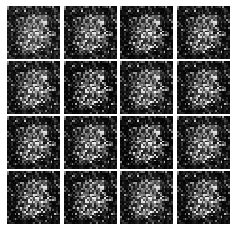

Epoch: 0, Iter: 340, D: 0.4463, G:0.2746


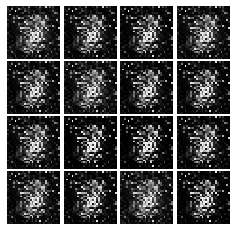

Epoch: 0, Iter: 360, D: 0.1847, G:0.5176


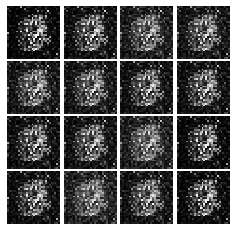

Epoch: 0, Iter: 380, D: 0.08142, G:0.4607


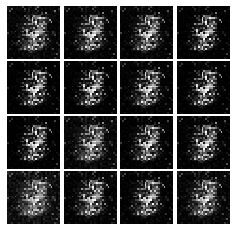

Epoch: 0, Iter: 400, D: 0.1041, G:0.4039


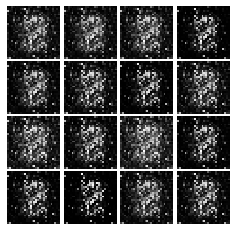

Epoch: 0, Iter: 420, D: 0.1106, G:0.6286


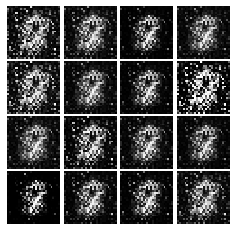

Epoch: 0, Iter: 440, D: 0.1225, G:0.4684


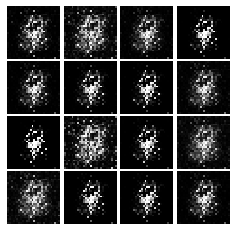

Epoch: 0, Iter: 460, D: 0.1107, G:0.3102


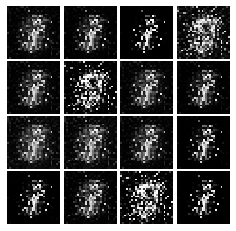

Epoch: 1, Iter: 480, D: 0.1045, G:0.6511


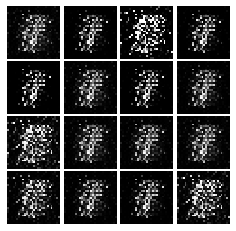

Epoch: 1, Iter: 500, D: 0.1407, G:0.3603


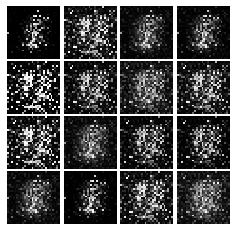

Epoch: 1, Iter: 520, D: 0.186, G:0.4647


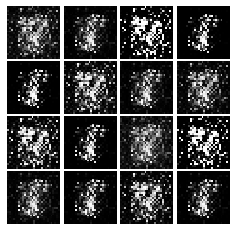

Epoch: 1, Iter: 540, D: 0.1199, G:0.5124


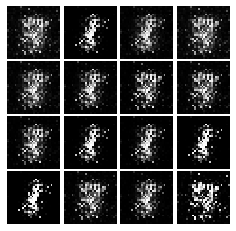

Epoch: 1, Iter: 560, D: 0.08543, G:0.4175


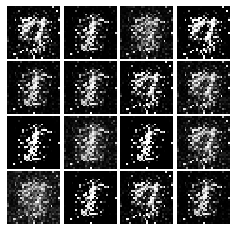

Epoch: 1, Iter: 580, D: 0.1137, G:0.4765


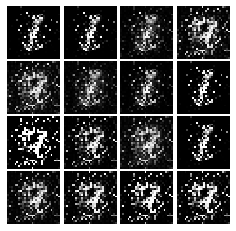

Epoch: 1, Iter: 600, D: 0.1222, G:0.5842


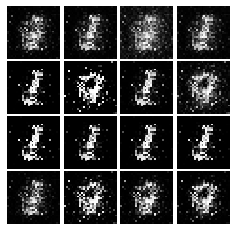

Epoch: 1, Iter: 620, D: 0.06175, G:0.4305


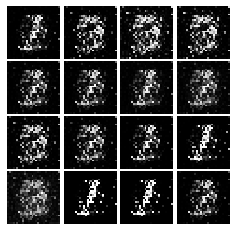

Epoch: 1, Iter: 640, D: 0.1024, G:0.4319


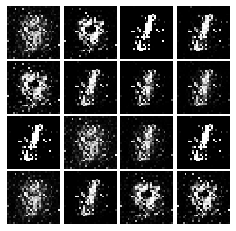

Epoch: 1, Iter: 660, D: 0.06969, G:0.7083


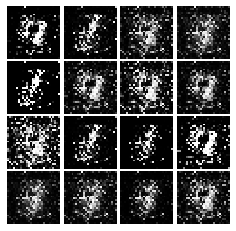

Epoch: 1, Iter: 680, D: 0.1179, G:0.4269


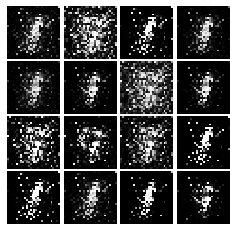

Epoch: 1, Iter: 700, D: 0.1675, G:0.3799


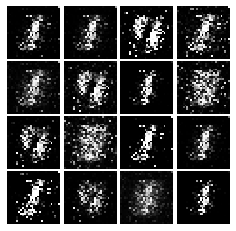

Epoch: 1, Iter: 720, D: 0.1367, G:0.2702


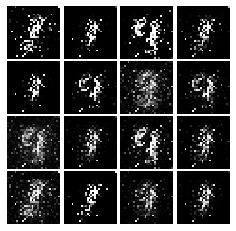

Epoch: 1, Iter: 740, D: 0.08745, G:0.6387


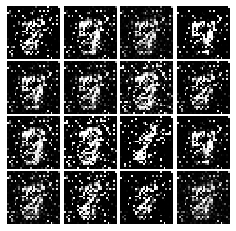

Epoch: 1, Iter: 760, D: 0.07602, G:0.3998


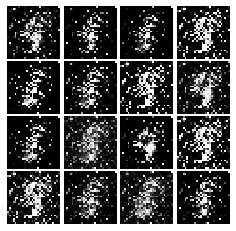

Epoch: 1, Iter: 780, D: 0.1427, G:0.4675


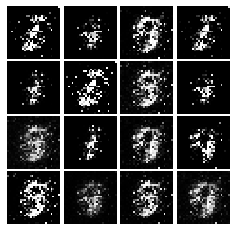

Epoch: 1, Iter: 800, D: 0.1269, G:0.416


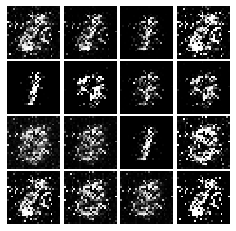

Epoch: 1, Iter: 820, D: 0.1131, G:0.3765


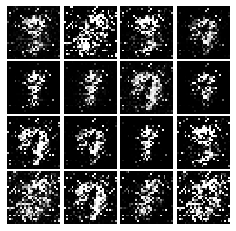

Epoch: 1, Iter: 840, D: 0.09145, G:0.426


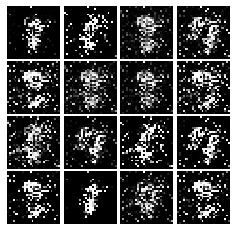

Epoch: 1, Iter: 860, D: 0.154, G:0.6937


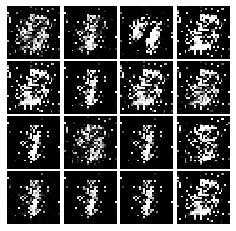

Epoch: 1, Iter: 880, D: 0.09817, G:0.3249


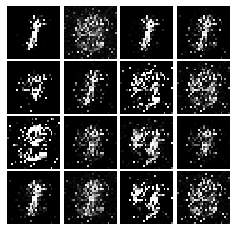

Epoch: 1, Iter: 900, D: 0.1085, G:1.434


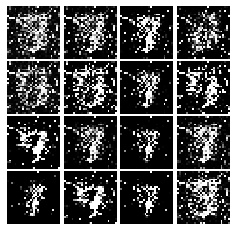

Epoch: 1, Iter: 920, D: 0.1298, G:0.2923


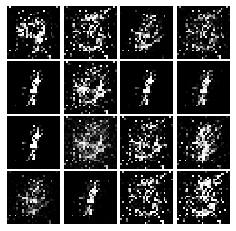

Epoch: 2, Iter: 940, D: 0.1245, G:0.5012


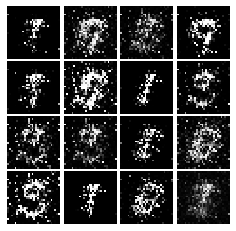

Epoch: 2, Iter: 960, D: 0.08765, G:0.4388


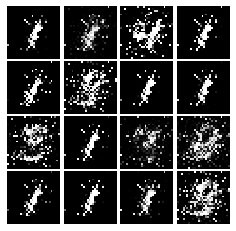

Epoch: 2, Iter: 980, D: 0.1147, G:0.3279


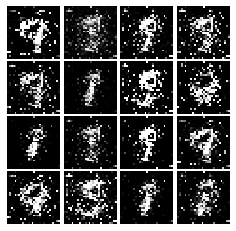

Epoch: 2, Iter: 1000, D: 0.1591, G:0.3468


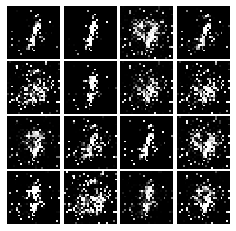

Epoch: 2, Iter: 1020, D: 0.1477, G:0.6393


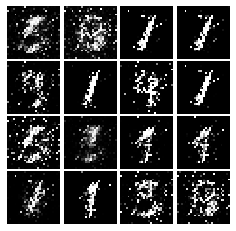

Epoch: 2, Iter: 1040, D: 0.4458, G:0.2535


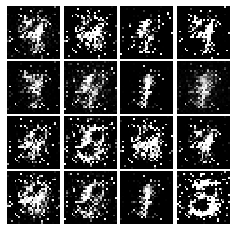

Epoch: 2, Iter: 1060, D: 0.1499, G:0.3597


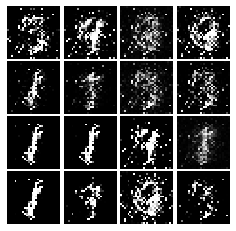

Epoch: 2, Iter: 1080, D: 0.09634, G:0.4289


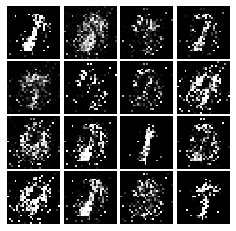

Epoch: 2, Iter: 1100, D: 0.09301, G:0.2557


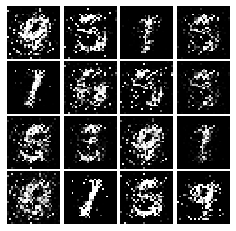

Epoch: 2, Iter: 1120, D: 0.1432, G:0.3247


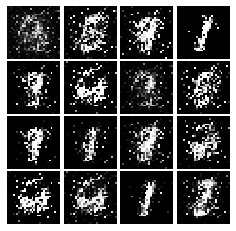

Epoch: 2, Iter: 1140, D: 0.2119, G:0.6839


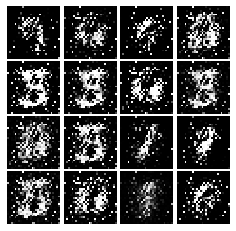

Epoch: 2, Iter: 1160, D: 0.144, G:0.4531


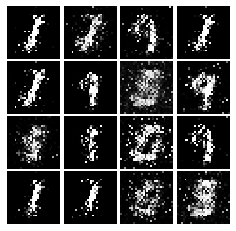

Epoch: 2, Iter: 1180, D: 0.1678, G:0.2685


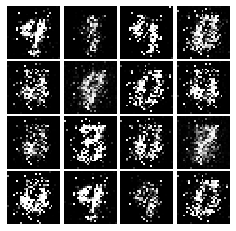

Epoch: 2, Iter: 1200, D: 0.2067, G:0.2715


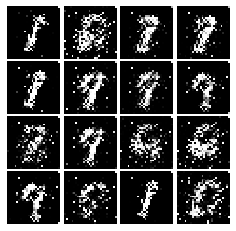

Epoch: 2, Iter: 1220, D: 0.1626, G:0.2772


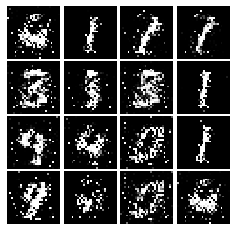

Epoch: 2, Iter: 1240, D: 0.1415, G:0.2833


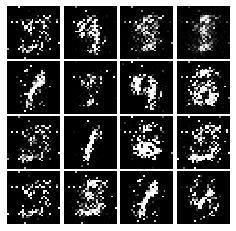

Epoch: 2, Iter: 1260, D: 0.2201, G:0.08311


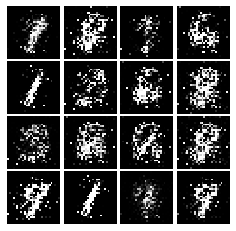

Epoch: 2, Iter: 1280, D: 0.1616, G:0.4233


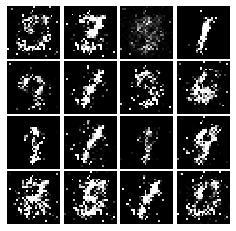

Epoch: 2, Iter: 1300, D: 0.1367, G:0.3042


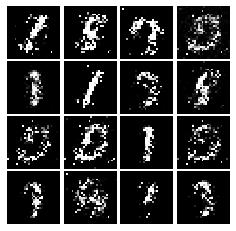

Epoch: 2, Iter: 1320, D: 0.1989, G:0.2012


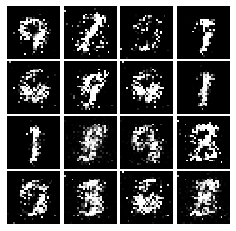

Epoch: 2, Iter: 1340, D: 0.1796, G:0.2261


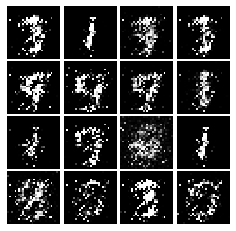

Epoch: 2, Iter: 1360, D: 0.1579, G:0.6449


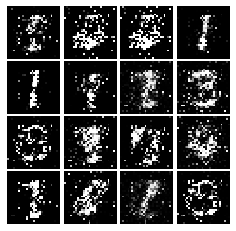

Epoch: 2, Iter: 1380, D: 0.196, G:0.2551


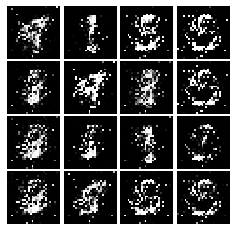

Epoch: 2, Iter: 1400, D: 0.1227, G:0.3074


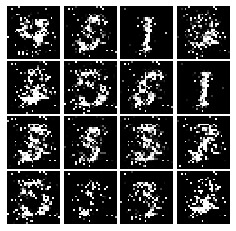

Epoch: 3, Iter: 1420, D: 0.1207, G:0.3546


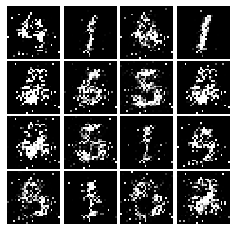

Epoch: 3, Iter: 1440, D: 0.1645, G:0.2604


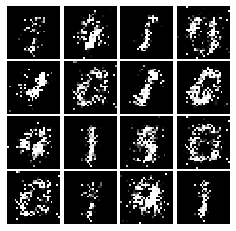

Epoch: 3, Iter: 1460, D: 0.183, G:0.2918


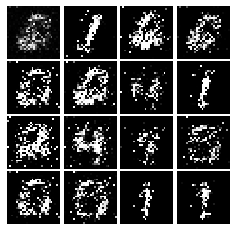

Epoch: 3, Iter: 1480, D: 0.1408, G:0.3152


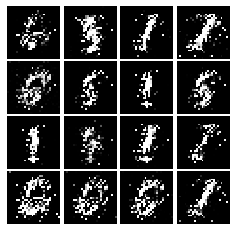

Epoch: 3, Iter: 1500, D: 0.142, G:0.3895


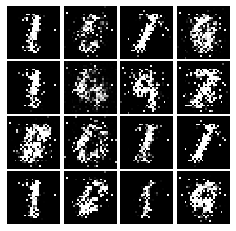

Epoch: 3, Iter: 1520, D: 0.5727, G:0.3699


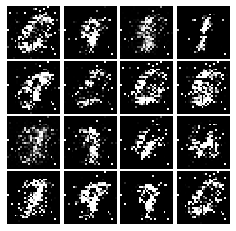

Epoch: 3, Iter: 1540, D: 0.1883, G:0.2662


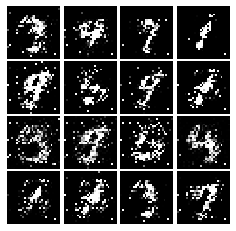

Epoch: 3, Iter: 1560, D: 0.1622, G:0.2648


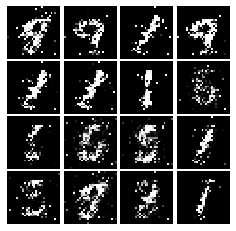

Epoch: 3, Iter: 1580, D: 0.1227, G:0.2368


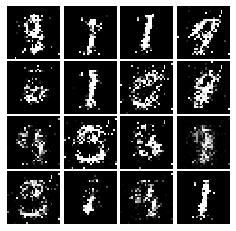

Epoch: 3, Iter: 1600, D: 0.1791, G:0.1961


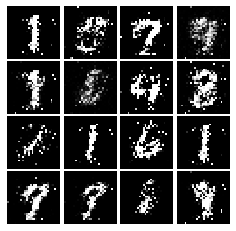

Epoch: 3, Iter: 1620, D: 0.1511, G:0.3784


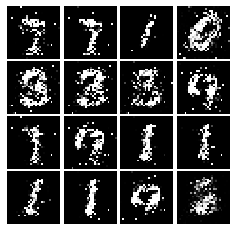

Epoch: 3, Iter: 1640, D: 0.1938, G:0.2448


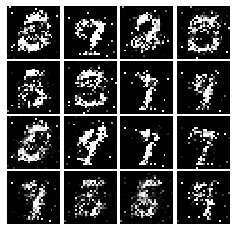

Epoch: 3, Iter: 1660, D: 0.1282, G:0.2171


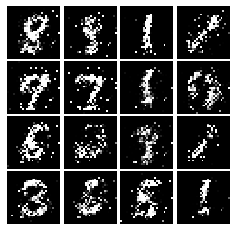

Epoch: 3, Iter: 1680, D: 0.2114, G:0.2528


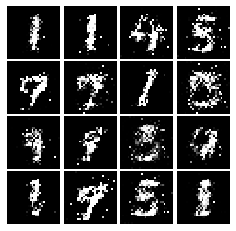

Epoch: 3, Iter: 1700, D: 0.1806, G:0.3016


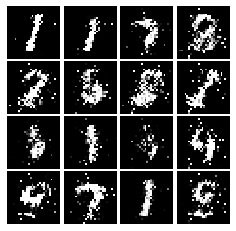

Epoch: 3, Iter: 1720, D: 0.1789, G:0.2123


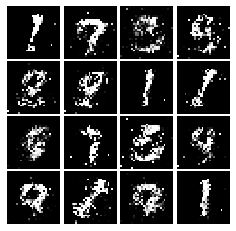

Epoch: 3, Iter: 1740, D: 0.1892, G:0.2036


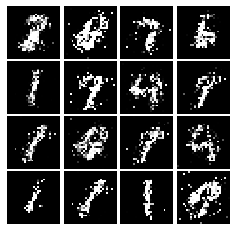

Epoch: 3, Iter: 1760, D: 0.1606, G:0.254


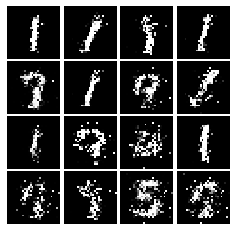

Epoch: 3, Iter: 1780, D: 0.1634, G:0.2498


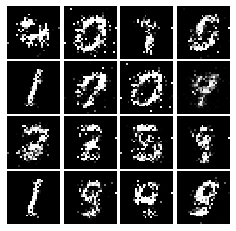

Epoch: 3, Iter: 1800, D: 0.182, G:0.2559


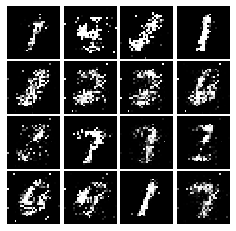

Epoch: 3, Iter: 1820, D: 0.2188, G:0.159


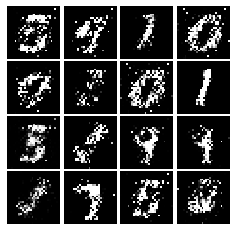

Epoch: 3, Iter: 1840, D: 0.1867, G:0.208


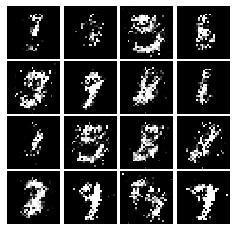

Epoch: 3, Iter: 1860, D: 0.2001, G:0.2202


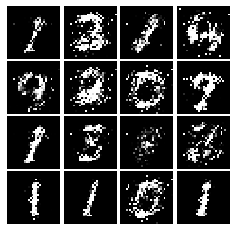

Epoch: 4, Iter: 1880, D: 0.2047, G:0.1943


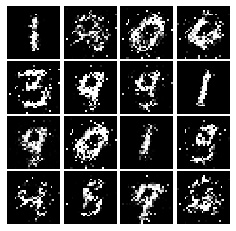

Epoch: 4, Iter: 1900, D: 0.1945, G:0.2639


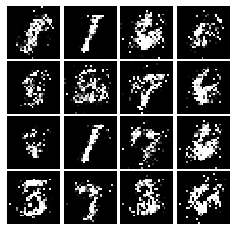

Epoch: 4, Iter: 1920, D: 0.2097, G:0.2029


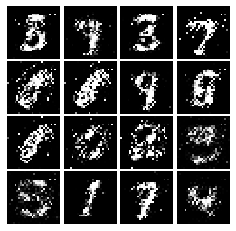

Epoch: 4, Iter: 1940, D: 0.1915, G:0.2233


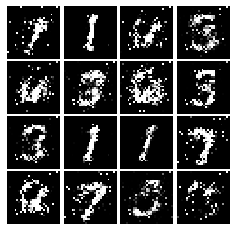

Epoch: 4, Iter: 1960, D: 0.202, G:0.2451


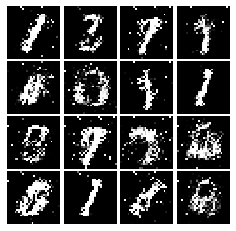

Epoch: 4, Iter: 1980, D: 0.2258, G:0.2341


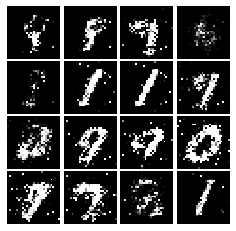

Epoch: 4, Iter: 2000, D: 0.2354, G:0.1782


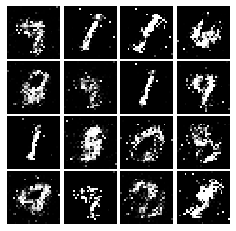

Epoch: 4, Iter: 2020, D: 0.2311, G:0.1834


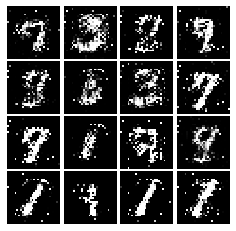

Epoch: 4, Iter: 2040, D: 0.2109, G:0.2009


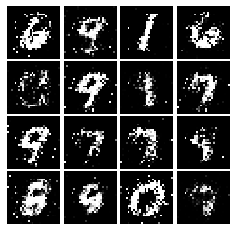

Epoch: 4, Iter: 2060, D: 0.2374, G:0.2803


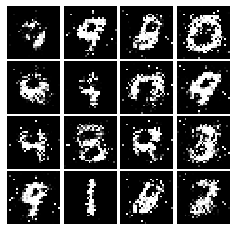

Epoch: 4, Iter: 2080, D: 0.2157, G:0.1917


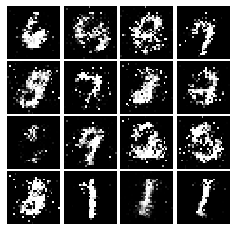

Epoch: 4, Iter: 2100, D: 0.2728, G:0.1885


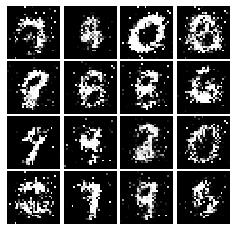

Epoch: 4, Iter: 2120, D: 0.2185, G:0.1891


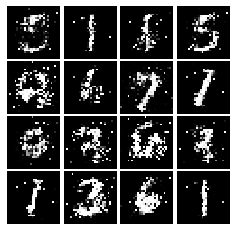

Epoch: 4, Iter: 2140, D: 0.2039, G:0.1793


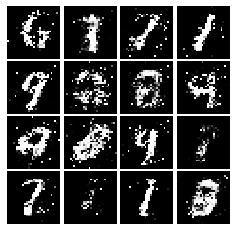

Epoch: 4, Iter: 2160, D: 0.2121, G:0.1502


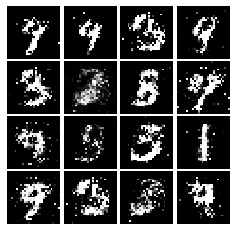

Epoch: 4, Iter: 2180, D: 0.2272, G:0.1977


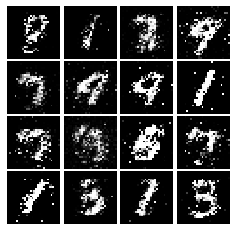

Epoch: 4, Iter: 2200, D: 0.1943, G:0.1892


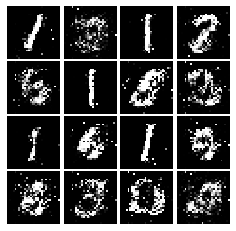

Epoch: 4, Iter: 2220, D: 0.2251, G:0.1955


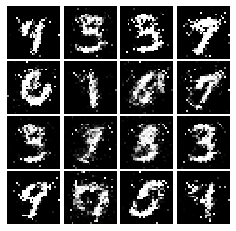

Epoch: 4, Iter: 2240, D: 0.2156, G:0.1635


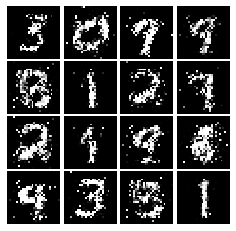

Epoch: 4, Iter: 2260, D: 0.2191, G:0.1789


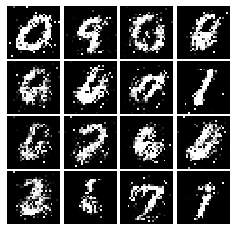

Epoch: 4, Iter: 2280, D: 0.2296, G:0.1971


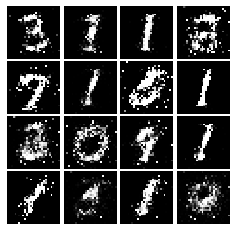

Epoch: 4, Iter: 2300, D: 0.2308, G:0.1738


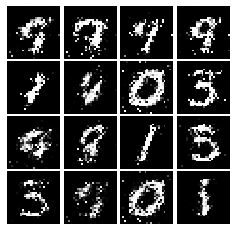

Epoch: 4, Iter: 2320, D: 0.2265, G:0.1765


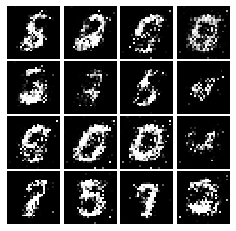

Epoch: 4, Iter: 2340, D: 0.2205, G:0.1708


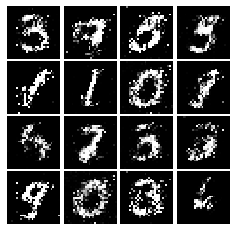

Epoch: 5, Iter: 2360, D: 0.1934, G:0.2248


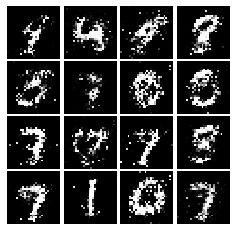

Epoch: 5, Iter: 2380, D: 0.2056, G:0.1791


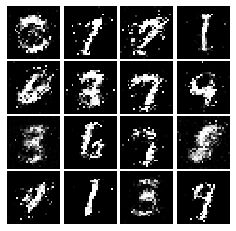

Epoch: 5, Iter: 2400, D: 0.2179, G:0.2006


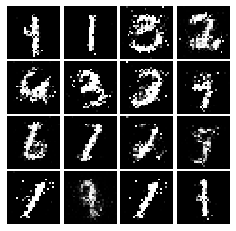

Epoch: 5, Iter: 2420, D: 0.2128, G:0.1982


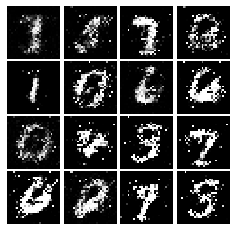

Epoch: 5, Iter: 2440, D: 0.2292, G:0.184


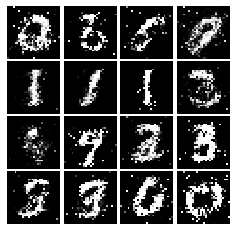

Epoch: 5, Iter: 2460, D: 0.1812, G:0.2043


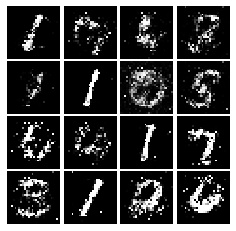

Epoch: 5, Iter: 2480, D: 0.1992, G:0.1878


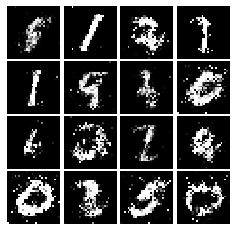

Epoch: 5, Iter: 2500, D: 0.1936, G:0.1673


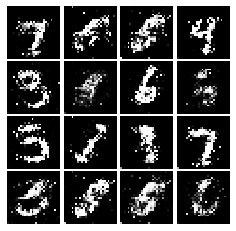

Epoch: 5, Iter: 2520, D: 0.2256, G:0.1994


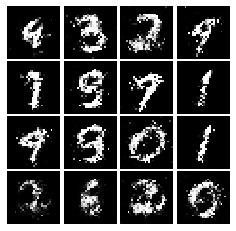

Epoch: 5, Iter: 2540, D: 0.2209, G:0.1885


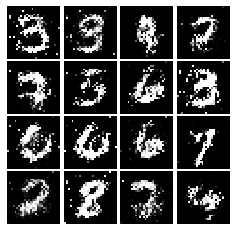

Epoch: 5, Iter: 2560, D: 0.2198, G:0.1755


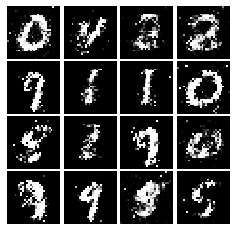

Epoch: 5, Iter: 2580, D: 0.2185, G:0.2043


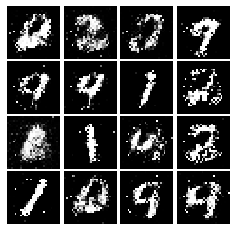

Epoch: 5, Iter: 2600, D: 0.2608, G:0.1673


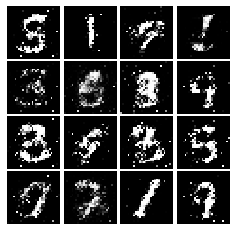

Epoch: 5, Iter: 2620, D: 0.2184, G:0.1936


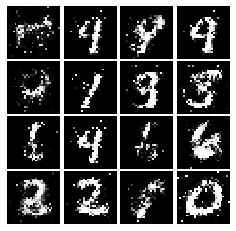

Epoch: 5, Iter: 2640, D: 0.2362, G:0.1823


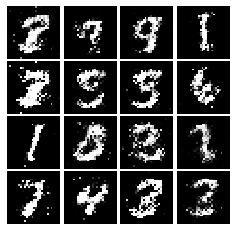

Epoch: 5, Iter: 2660, D: 0.2169, G:0.1838


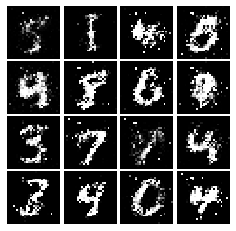

Epoch: 5, Iter: 2680, D: 0.2194, G:0.1859


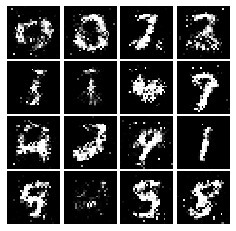

Epoch: 5, Iter: 2700, D: 0.2207, G:0.1834


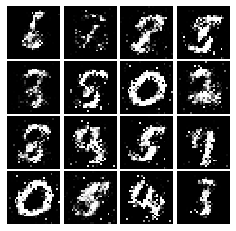

Epoch: 5, Iter: 2720, D: 0.2204, G:0.1783


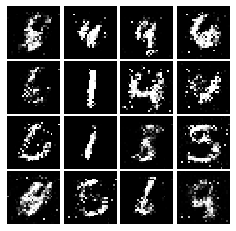

Epoch: 5, Iter: 2740, D: 0.2238, G:0.1836


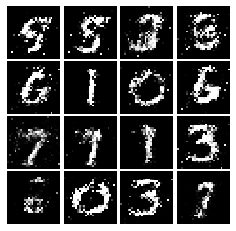

Epoch: 5, Iter: 2760, D: 0.2448, G:0.1548


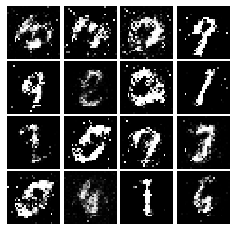

Epoch: 5, Iter: 2780, D: 0.2285, G:0.1783


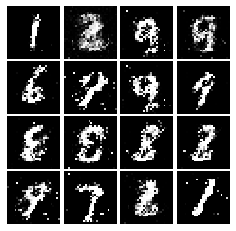

Epoch: 5, Iter: 2800, D: 0.224, G:0.1929


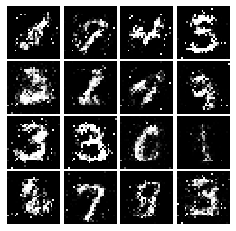

Epoch: 6, Iter: 2820, D: 0.2114, G:0.1681


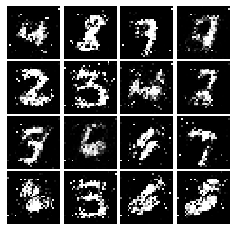

Epoch: 6, Iter: 2840, D: 0.224, G:0.1672


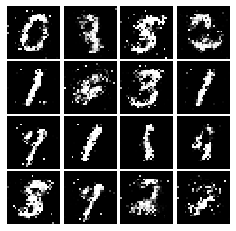

Epoch: 6, Iter: 2860, D: 0.2086, G:0.1983


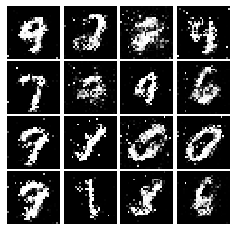

Epoch: 6, Iter: 2880, D: 0.2125, G:0.1913


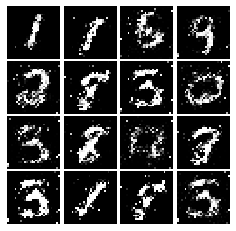

Epoch: 6, Iter: 2900, D: 0.2187, G:0.1944


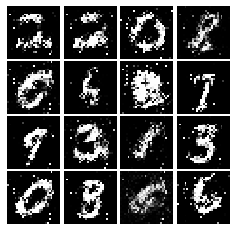

Epoch: 6, Iter: 2920, D: 0.2443, G:0.1889


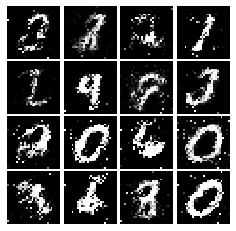

Epoch: 6, Iter: 2940, D: 0.2224, G:0.1492


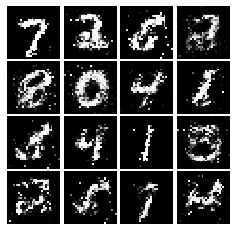

Epoch: 6, Iter: 2960, D: 0.23, G:0.1606


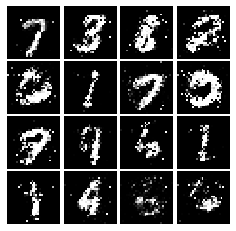

Epoch: 6, Iter: 2980, D: 0.2394, G:0.1462


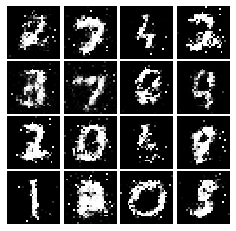

Epoch: 6, Iter: 3000, D: 0.2259, G:0.1656


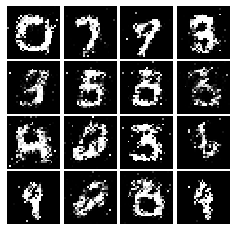

Epoch: 6, Iter: 3020, D: 0.2051, G:0.1758


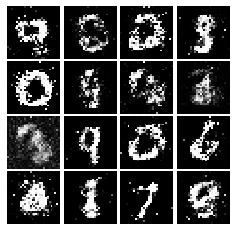

Epoch: 6, Iter: 3040, D: 0.2187, G:0.1798


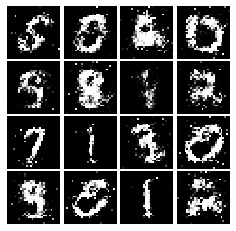

Epoch: 6, Iter: 3060, D: 0.233, G:0.1616


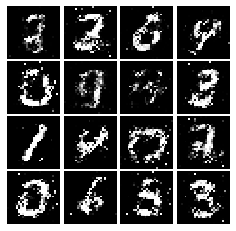

Epoch: 6, Iter: 3080, D: 0.2223, G:0.1752


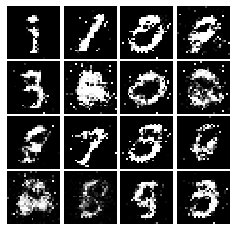

Epoch: 6, Iter: 3100, D: 0.2193, G:0.1917


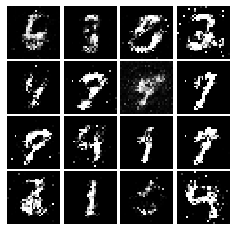

Epoch: 6, Iter: 3120, D: 0.2118, G:0.1613


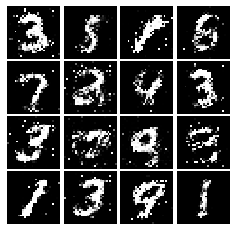

Epoch: 6, Iter: 3140, D: 0.26, G:0.171


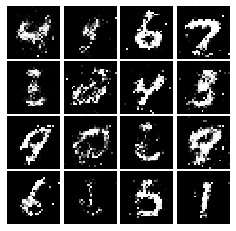

Epoch: 6, Iter: 3160, D: 0.2455, G:0.1306


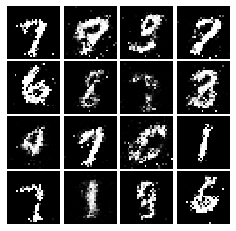

Epoch: 6, Iter: 3180, D: 0.2328, G:0.171


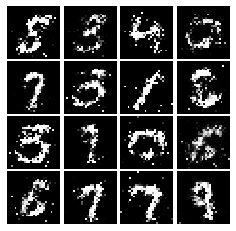

Epoch: 6, Iter: 3200, D: 0.2251, G:0.1898


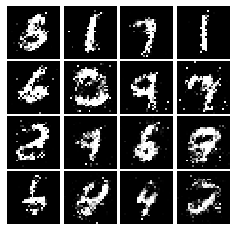

Epoch: 6, Iter: 3220, D: 0.2488, G:0.176


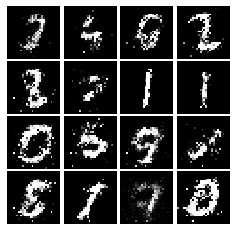

Epoch: 6, Iter: 3240, D: 0.2139, G:0.141


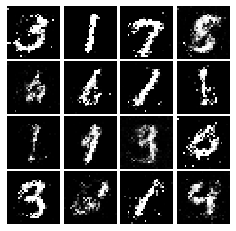

Epoch: 6, Iter: 3260, D: 0.2254, G:0.1492


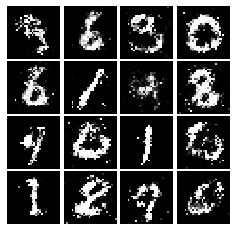

Epoch: 6, Iter: 3280, D: 0.226, G:0.1738


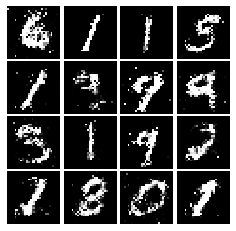

Epoch: 7, Iter: 3300, D: 0.2141, G:0.1778


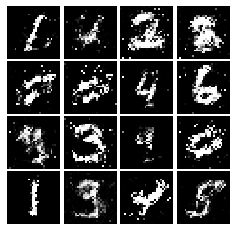

Epoch: 7, Iter: 3320, D: 0.2295, G:0.1492


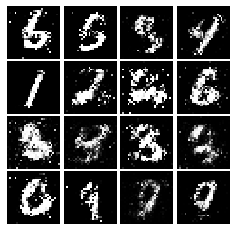

Epoch: 7, Iter: 3340, D: 0.2216, G:0.1919


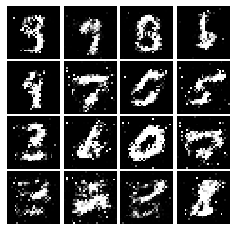

Epoch: 7, Iter: 3360, D: 0.2479, G:0.1912


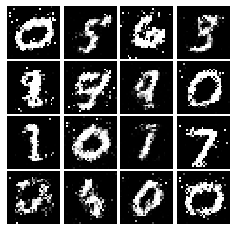

Epoch: 7, Iter: 3380, D: 0.2308, G:0.1477


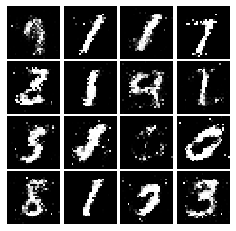

Epoch: 7, Iter: 3400, D: 0.249, G:0.1411


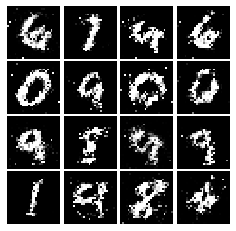

Epoch: 7, Iter: 3420, D: 0.2498, G:0.173


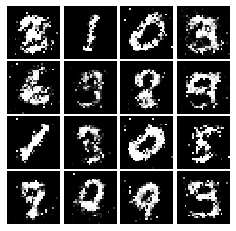

Epoch: 7, Iter: 3440, D: 0.2294, G:0.1878


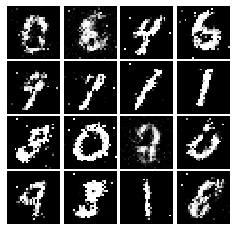

Epoch: 7, Iter: 3460, D: 0.2162, G:0.1509


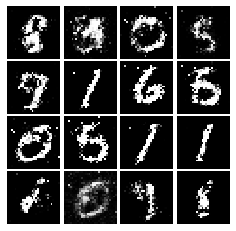

Epoch: 7, Iter: 3480, D: 0.2292, G:0.1431


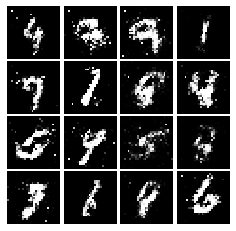

Epoch: 7, Iter: 3500, D: 0.2292, G:0.1678


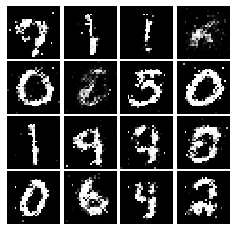

Epoch: 7, Iter: 3520, D: 0.2556, G:0.1533


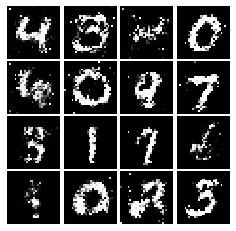

Epoch: 7, Iter: 3540, D: 0.2235, G:0.1561


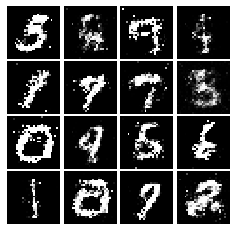

Epoch: 7, Iter: 3560, D: 0.2186, G:0.1672


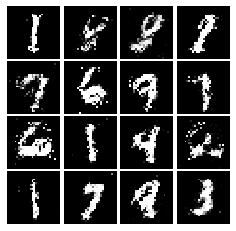

Epoch: 7, Iter: 3580, D: 0.2336, G:0.1542


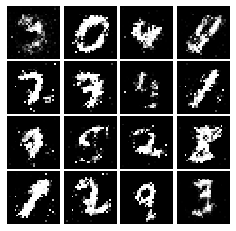

Epoch: 7, Iter: 3600, D: 0.2329, G:0.1932


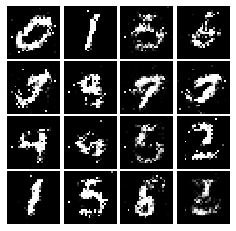

Epoch: 7, Iter: 3620, D: 0.232, G:0.1744


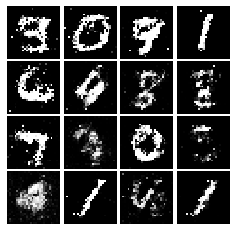

Epoch: 7, Iter: 3640, D: 0.2462, G:0.1634


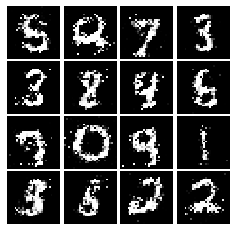

Epoch: 7, Iter: 3660, D: 0.2107, G:0.2114


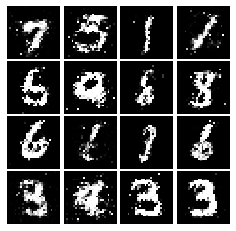

Epoch: 7, Iter: 3680, D: 0.2188, G:0.1585


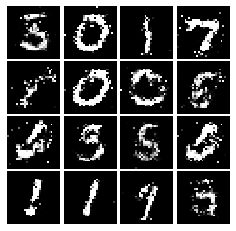

Epoch: 7, Iter: 3700, D: 0.2208, G:0.1598


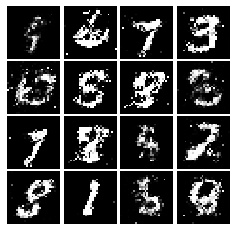

Epoch: 7, Iter: 3720, D: 0.2344, G:0.1576


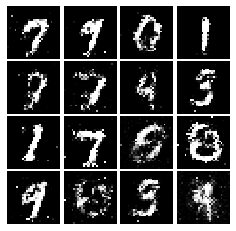

Epoch: 7, Iter: 3740, D: 0.2239, G:0.1708


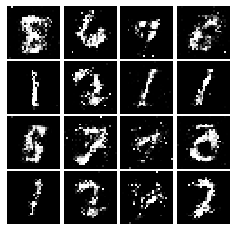

Epoch: 8, Iter: 3760, D: 0.234, G:0.1831


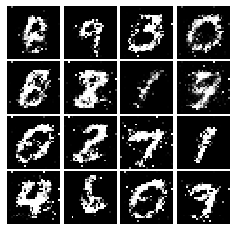

Epoch: 8, Iter: 3780, D: 0.2335, G:0.1587


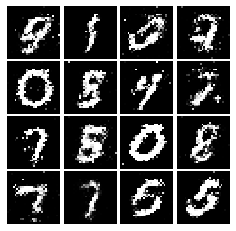

Epoch: 8, Iter: 3800, D: 0.2201, G:0.1656


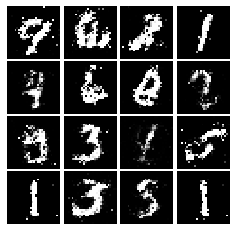

Epoch: 8, Iter: 3820, D: 0.2085, G:0.2141


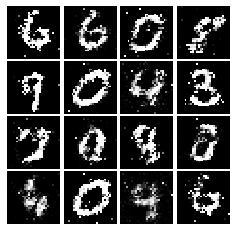

Epoch: 8, Iter: 3840, D: 0.2354, G:0.1466


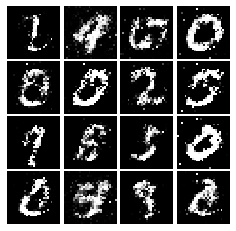

Epoch: 8, Iter: 3860, D: 0.2342, G:0.1417


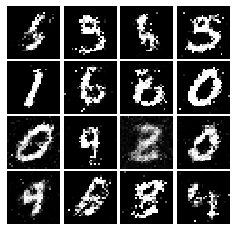

Epoch: 8, Iter: 3880, D: 0.2336, G:0.2471


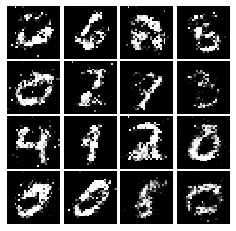

Epoch: 8, Iter: 3900, D: 0.2279, G:0.1622


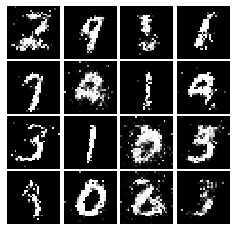

Epoch: 8, Iter: 3920, D: 0.2173, G:0.1814


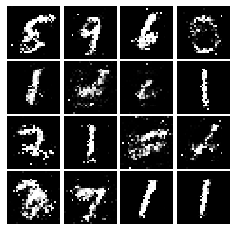

Epoch: 8, Iter: 3940, D: 0.2214, G:0.1552


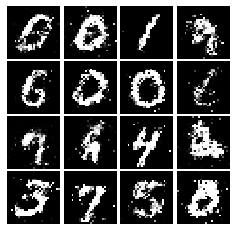

Epoch: 8, Iter: 3960, D: 0.2296, G:0.1699


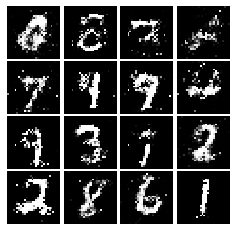

Epoch: 8, Iter: 3980, D: 0.2436, G:0.1443


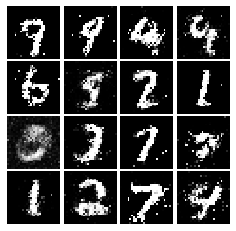

Epoch: 8, Iter: 4000, D: 0.2316, G:0.1679


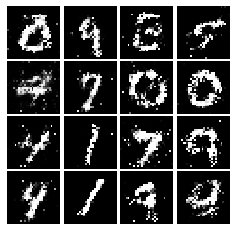

Epoch: 8, Iter: 4020, D: 0.236, G:0.1304


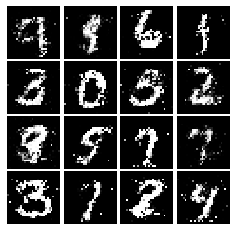

Epoch: 8, Iter: 4040, D: 0.2135, G:0.1581


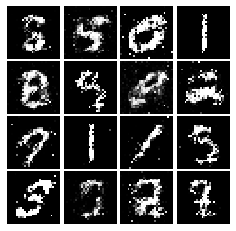

Epoch: 8, Iter: 4060, D: 0.2328, G:0.1474


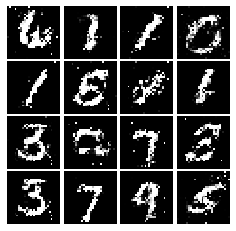

Epoch: 8, Iter: 4080, D: 0.2358, G:0.1552


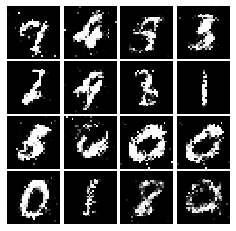

Epoch: 8, Iter: 4100, D: 0.2564, G:0.1717


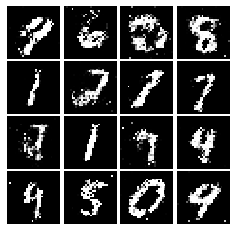

Epoch: 8, Iter: 4120, D: 0.2004, G:0.1865


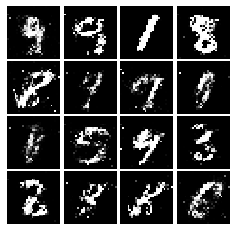

Epoch: 8, Iter: 4140, D: 0.2372, G:0.169


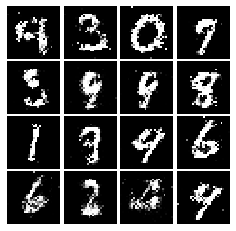

Epoch: 8, Iter: 4160, D: 0.2457, G:0.1596


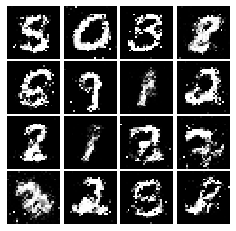

Epoch: 8, Iter: 4180, D: 0.2543, G:0.1729


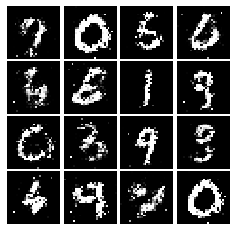

Epoch: 8, Iter: 4200, D: 0.2397, G:0.1514


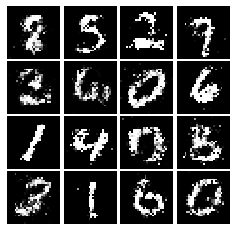

Epoch: 8, Iter: 4220, D: 0.2368, G:0.1995


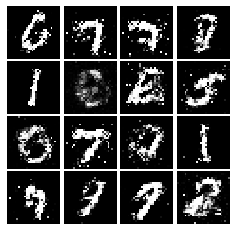

Epoch: 9, Iter: 4240, D: 0.2636, G:0.1498


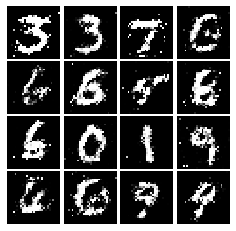

Epoch: 9, Iter: 4260, D: 0.2335, G:0.1672


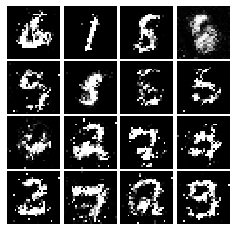

Epoch: 9, Iter: 4280, D: 0.2651, G:0.1674


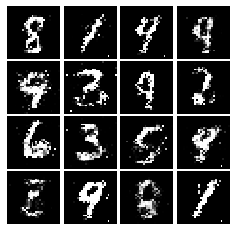

Epoch: 9, Iter: 4300, D: 0.2429, G:0.1643


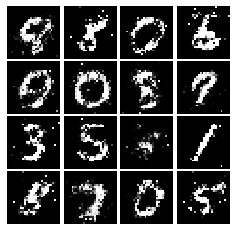

Epoch: 9, Iter: 4320, D: 0.2278, G:0.2034


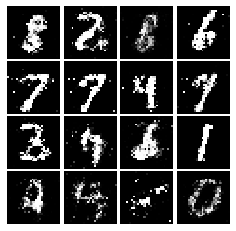

Epoch: 9, Iter: 4340, D: 0.2409, G:0.1632


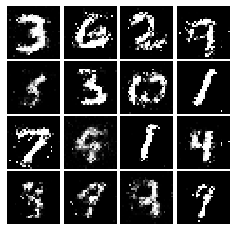

Epoch: 9, Iter: 4360, D: 0.2287, G:0.163


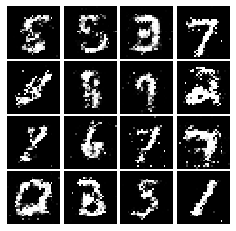

Epoch: 9, Iter: 4380, D: 0.2543, G:0.1497


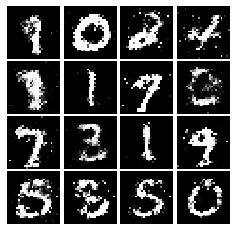

Epoch: 9, Iter: 4400, D: 0.2047, G:0.2197


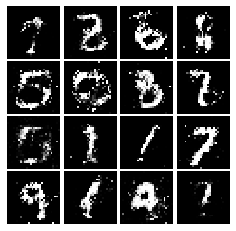

Epoch: 9, Iter: 4420, D: 0.2262, G:0.1576


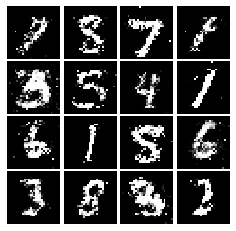

Epoch: 9, Iter: 4440, D: 0.2268, G:0.163


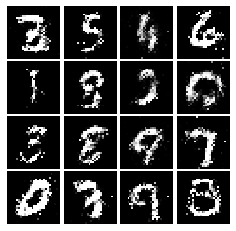

Epoch: 9, Iter: 4460, D: 0.2396, G:0.1471


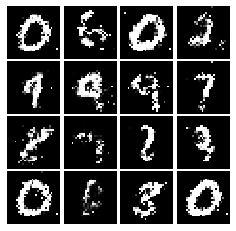

Epoch: 9, Iter: 4480, D: 0.2346, G:0.1512


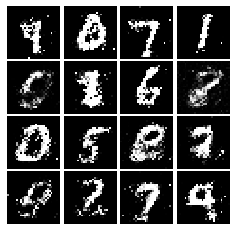

Epoch: 9, Iter: 4500, D: 0.2828, G:0.1602


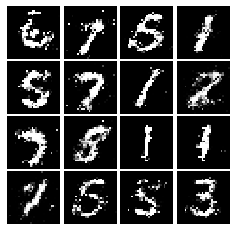

Epoch: 9, Iter: 4520, D: 0.241, G:0.157


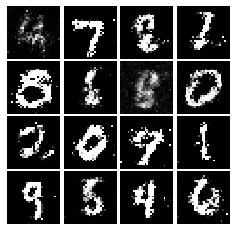

Epoch: 9, Iter: 4540, D: 0.2402, G:0.1658


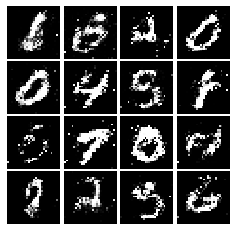

Epoch: 9, Iter: 4560, D: 0.2352, G:0.1612


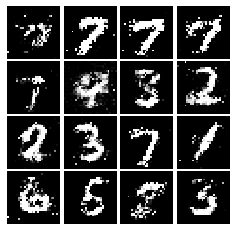

Epoch: 9, Iter: 4580, D: 0.2608, G:0.1363


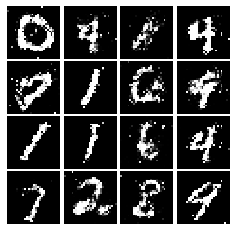

Epoch: 9, Iter: 4600, D: 0.2539, G:0.1597


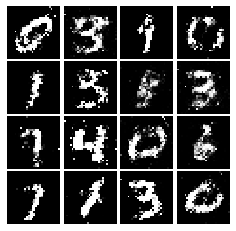

Epoch: 9, Iter: 4620, D: 0.266, G:0.1393


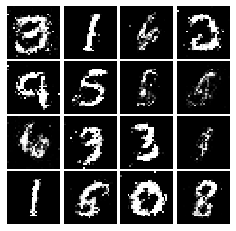

Epoch: 9, Iter: 4640, D: 0.242, G:0.1613


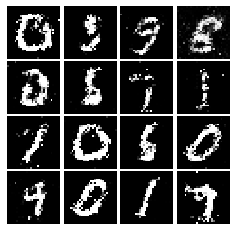

Epoch: 9, Iter: 4660, D: 0.2372, G:0.1572


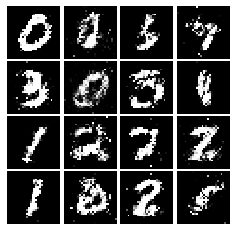

Epoch: 9, Iter: 4680, D: 0.2441, G:0.1407


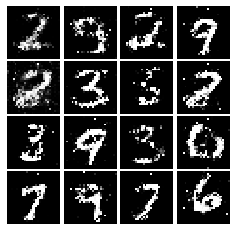

Final images


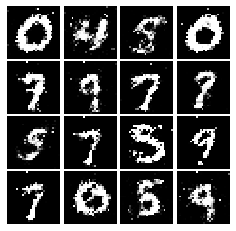

In [81]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [94]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Reshape((28,28,1), input_shape = (784,)),
        tf.keras.layers.Conv2D(32, kernel_size=(5, 5), strides=1, padding="VALID", activation=tf.keras.layers.LeakyReLU(alpha = .01)),
        tf.keras.layers.MaxPool2D(2, strides = 2),
        tf.keras.layers.Conv2D(64, kernel_size=(5, 5), strides=1, padding="VALID", activation=tf.keras.layers.LeakyReLU(alpha = .01)),
        tf.keras.layers.MaxPool2D(2, strides = 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64, activation = tf.keras.layers.LeakyReLU(alpha = .01)),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [102]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    tf.keras.layers.Dense(1024,input_shape = (noise_dim,), activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128, activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape([7,7,128]),
    tf.keras.layers.Conv2DTranspose(64, kernel_size = 4, strides = 2, activation = 'relu', padding = 'SAME'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(1, kernel_size = 4, strides = 2, activation = 'tanh', padding= 'SAME')

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.406, G:0.6556


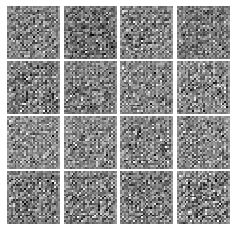

Epoch: 0, Iter: 20, D: 0.2071, G:1.977


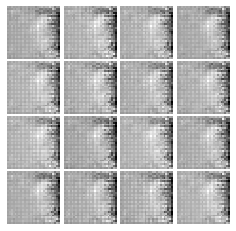

Epoch: 0, Iter: 40, D: 0.005052, G:5.494


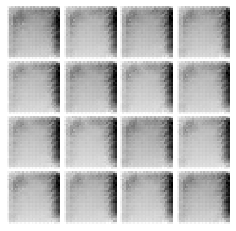

Epoch: 0, Iter: 60, D: 0.001543, G:2.804


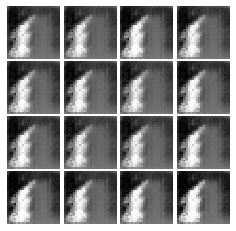

Epoch: 0, Iter: 80, D: 0.3982, G:1.743


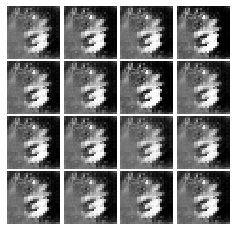

Epoch: 0, Iter: 100, D: 0.1637, G:3.661


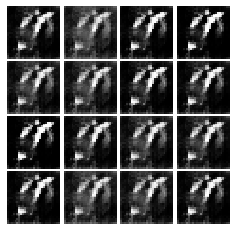

Epoch: 0, Iter: 120, D: 0.7033, G:2.705


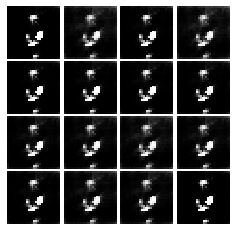

Epoch: 0, Iter: 140, D: 0.07511, G:3.685


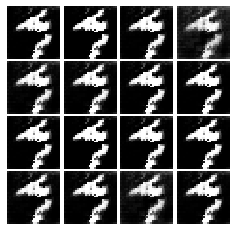

Epoch: 0, Iter: 160, D: 0.09832, G:4.771


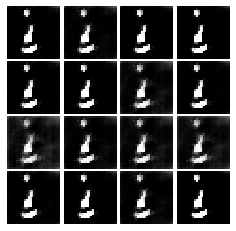

Epoch: 0, Iter: 180, D: 0.2419, G:0.912


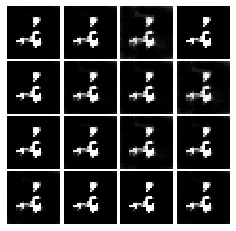

Epoch: 0, Iter: 200, D: 0.268, G:3.793


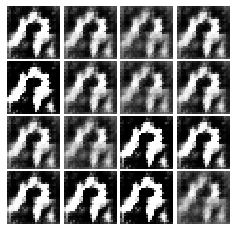

Epoch: 0, Iter: 220, D: 0.7139, G:1.266


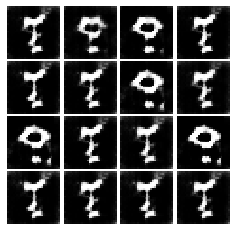

Epoch: 0, Iter: 240, D: 0.7688, G:2.928


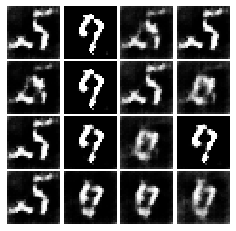

Epoch: 0, Iter: 260, D: 0.5127, G:3.22


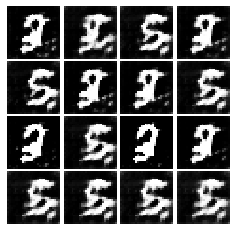

Epoch: 0, Iter: 280, D: 0.3961, G:2.259


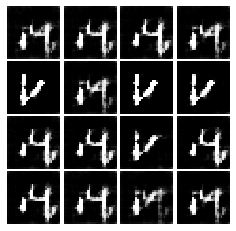

Epoch: 0, Iter: 300, D: 0.6205, G:2.304


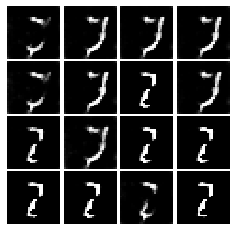

Epoch: 0, Iter: 320, D: 0.5977, G:1.657


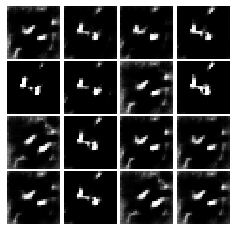

Epoch: 0, Iter: 340, D: 1.657, G:13.29


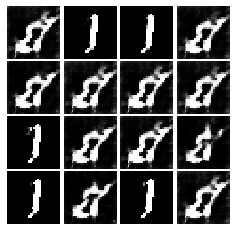

Epoch: 0, Iter: 360, D: 1.151, G:5.402


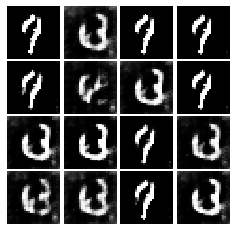

Epoch: 0, Iter: 380, D: 0.2401, G:3.383


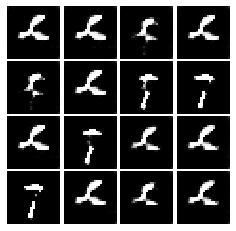

Epoch: 0, Iter: 400, D: 0.2478, G:3.084


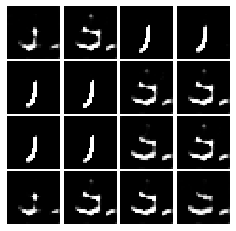

Epoch: 0, Iter: 420, D: 0.358, G:3.289


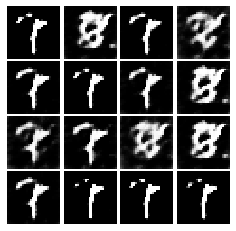

Epoch: 0, Iter: 440, D: 0.572, G:2.579


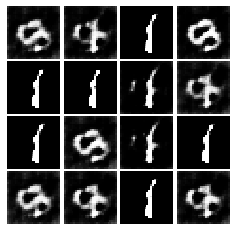

Epoch: 0, Iter: 460, D: 0.1722, G:4.031


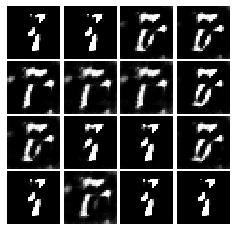

Epoch: 1, Iter: 480, D: 0.6349, G:3.269


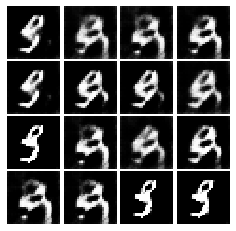

Epoch: 1, Iter: 500, D: 0.785, G:2.42


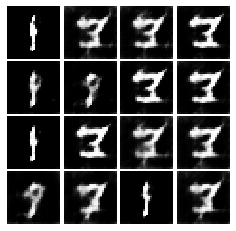

Epoch: 1, Iter: 520, D: 0.5013, G:3.777


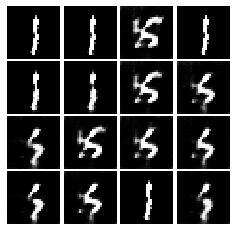

Epoch: 1, Iter: 540, D: 0.3562, G:3.15


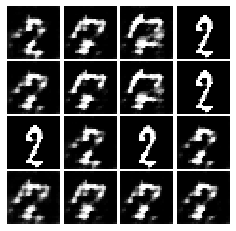

Epoch: 1, Iter: 560, D: 0.2503, G:2.96


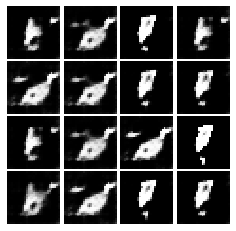

Epoch: 1, Iter: 580, D: 0.4263, G:4.34


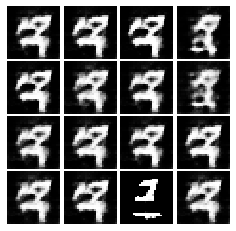

Epoch: 1, Iter: 600, D: 1.004, G:2.839


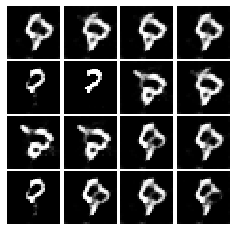

Epoch: 1, Iter: 620, D: 0.9031, G:2.25


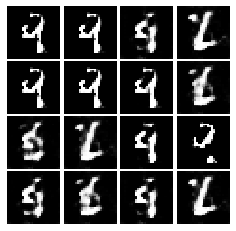

Epoch: 1, Iter: 640, D: 1.219, G:9.26


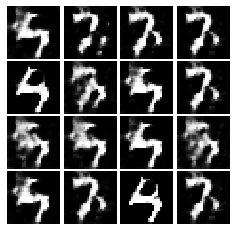

Epoch: 1, Iter: 660, D: 0.589, G:3.971


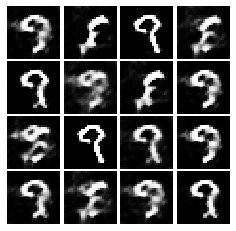

Epoch: 1, Iter: 680, D: 0.3583, G:2.661


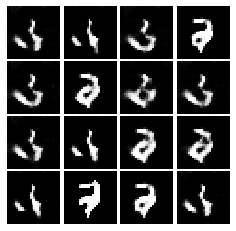

Epoch: 1, Iter: 700, D: 0.1819, G:2.799


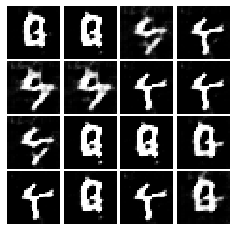

Epoch: 1, Iter: 720, D: 0.2119, G:2.73


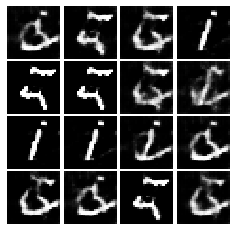

Epoch: 1, Iter: 740, D: 0.3213, G:2.717


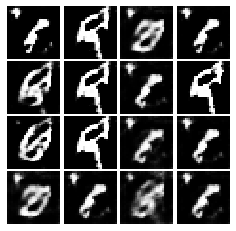

Epoch: 1, Iter: 760, D: 0.584, G:2.972


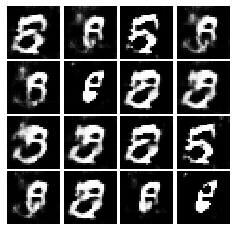

Epoch: 1, Iter: 780, D: 0.3277, G:3.264


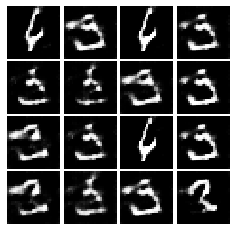

Epoch: 1, Iter: 800, D: 0.1148, G:4.417


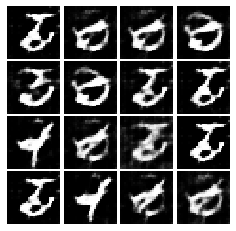

Epoch: 1, Iter: 820, D: 2.544, G:13.8


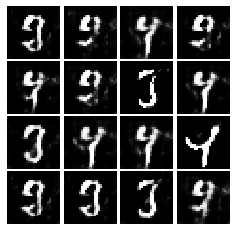

Epoch: 1, Iter: 840, D: 0.5669, G:3.18


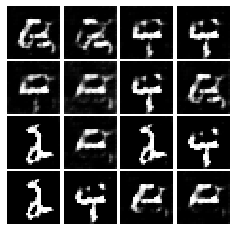

Epoch: 1, Iter: 860, D: 0.8948, G:9.145


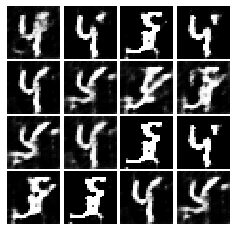

Epoch: 1, Iter: 880, D: 0.2526, G:4.476


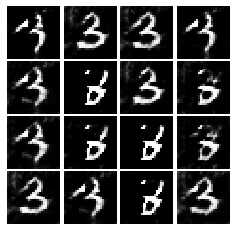

Epoch: 1, Iter: 900, D: 0.1653, G:2.704


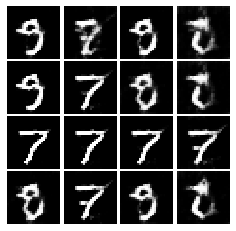

Epoch: 1, Iter: 920, D: 0.353, G:3.997


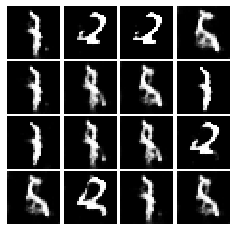

Epoch: 2, Iter: 940, D: 0.517, G:2.499


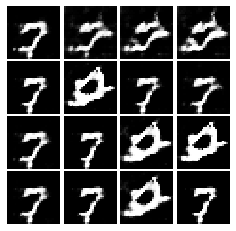

Epoch: 2, Iter: 960, D: 0.7404, G:1.879


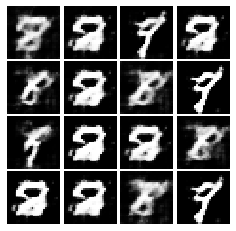

Epoch: 2, Iter: 980, D: 0.4914, G:2.803


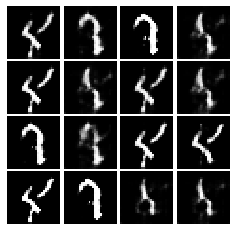

Epoch: 2, Iter: 1000, D: 0.3563, G:3.083


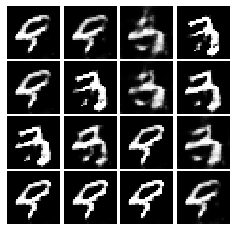

Epoch: 2, Iter: 1020, D: 0.3807, G:7.483


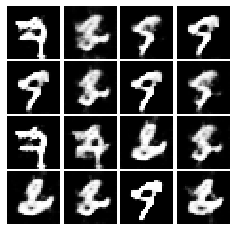

Epoch: 2, Iter: 1040, D: 1.352, G:9.893


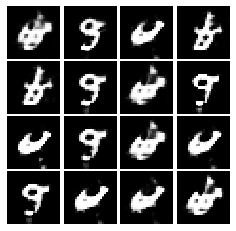

Epoch: 2, Iter: 1060, D: 0.4635, G:2.747


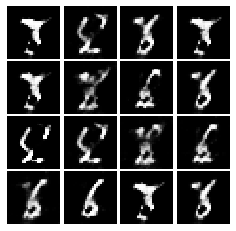

Epoch: 2, Iter: 1080, D: 0.6351, G:2.818


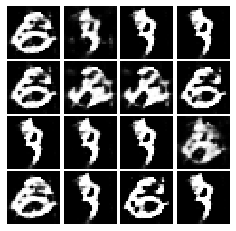

Epoch: 2, Iter: 1100, D: 0.5043, G:4.392


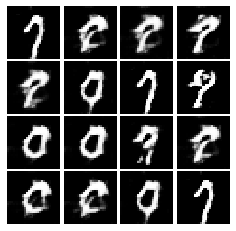

Epoch: 2, Iter: 1120, D: 0.3071, G:3.65


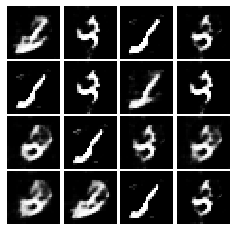

Epoch: 2, Iter: 1140, D: 0.2206, G:3.746


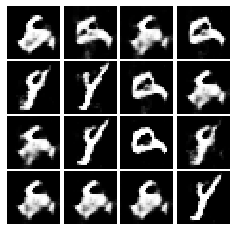

Epoch: 2, Iter: 1160, D: 6.842, G:5.035


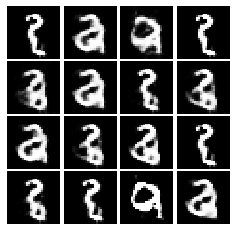

Epoch: 2, Iter: 1180, D: 0.6516, G:3.414


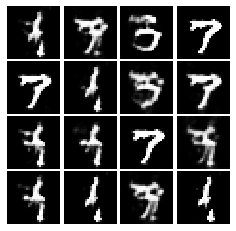

Epoch: 2, Iter: 1200, D: 0.2053, G:3.402


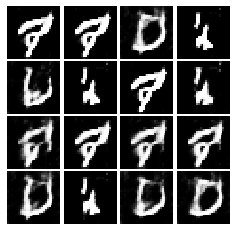

Epoch: 2, Iter: 1220, D: 0.1566, G:3.237


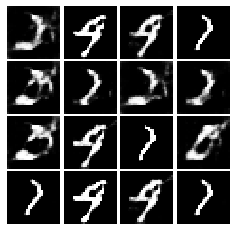

Epoch: 2, Iter: 1240, D: 0.264, G:3.166


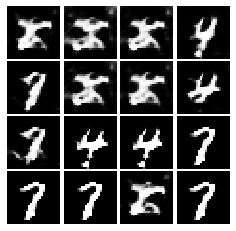

Epoch: 2, Iter: 1260, D: 0.3804, G:3.808


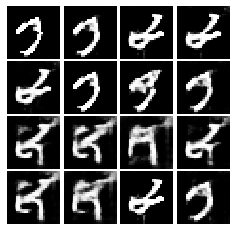

Epoch: 2, Iter: 1280, D: 0.1068, G:4.394


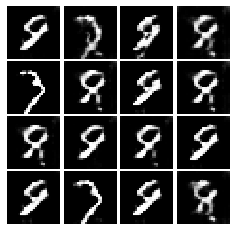

Epoch: 2, Iter: 1300, D: 0.4481, G:3.509


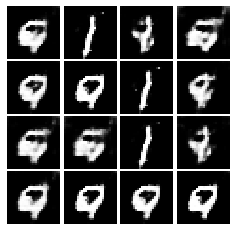

Epoch: 2, Iter: 1320, D: 0.7256, G:3.481


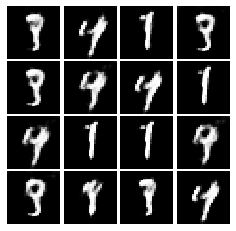

Epoch: 2, Iter: 1340, D: 0.769, G:2.944


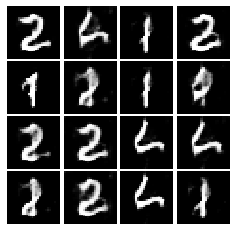

Epoch: 2, Iter: 1360, D: 0.4292, G:3.048


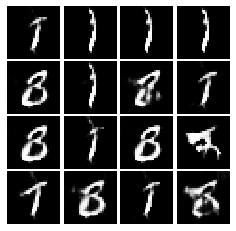

Epoch: 2, Iter: 1380, D: 0.5335, G:4.066


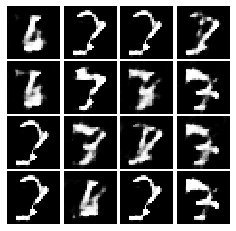

Epoch: 2, Iter: 1400, D: 0.2598, G:6.263


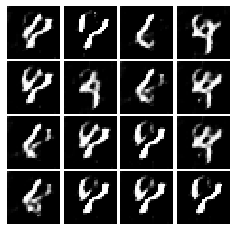

Epoch: 3, Iter: 1420, D: 0.128, G:3.904


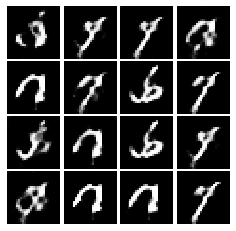

Epoch: 3, Iter: 1440, D: 0.2824, G:2.858


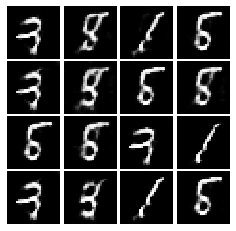

Epoch: 3, Iter: 1460, D: 0.9177, G:2.526


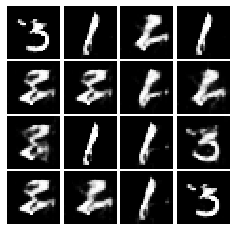

Epoch: 3, Iter: 1480, D: 0.5513, G:3.518


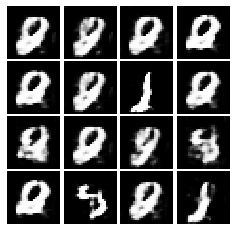

Epoch: 3, Iter: 1500, D: 0.3125, G:3.757


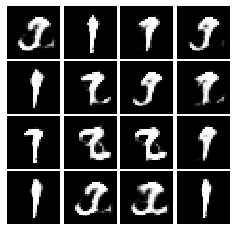

Epoch: 3, Iter: 1520, D: 0.6261, G:4.496


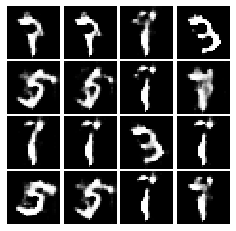

Epoch: 3, Iter: 1540, D: 0.2743, G:4.383


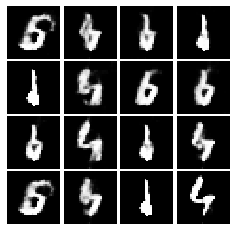

Epoch: 3, Iter: 1560, D: 1.942, G:6.513


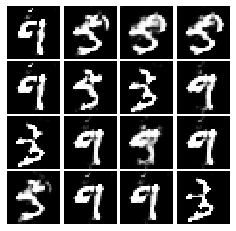

Epoch: 3, Iter: 1580, D: 0.4207, G:3.882


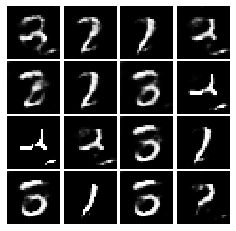

Epoch: 3, Iter: 1600, D: 0.3279, G:3.192


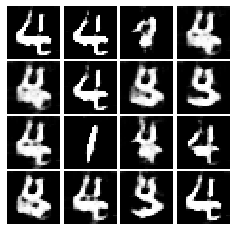

Epoch: 3, Iter: 1620, D: 0.2934, G:3.629


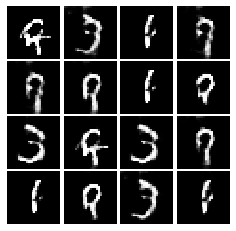

Epoch: 3, Iter: 1640, D: 0.4647, G:5.565


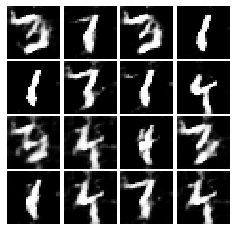

Epoch: 3, Iter: 1660, D: 0.2759, G:3.558


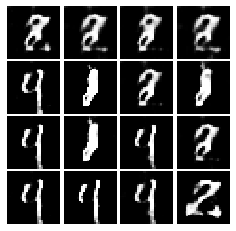

Epoch: 3, Iter: 1680, D: 0.3149, G:4.322


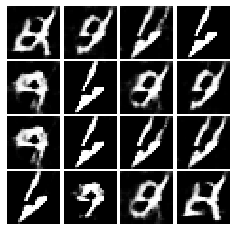

Epoch: 3, Iter: 1700, D: 0.2332, G:4.484


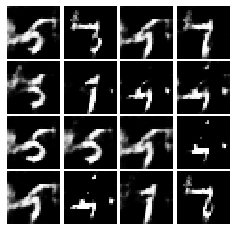

Epoch: 3, Iter: 1720, D: 0.2259, G:3.722


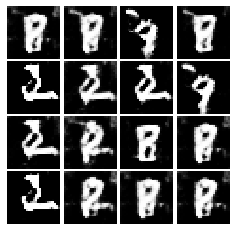

Epoch: 3, Iter: 1740, D: 0.3726, G:4.053


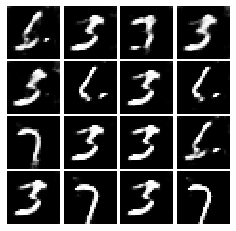

Epoch: 3, Iter: 1760, D: 0.2178, G:3.973


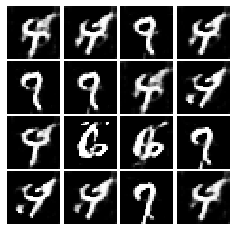

Epoch: 3, Iter: 1780, D: 0.2152, G:4.712


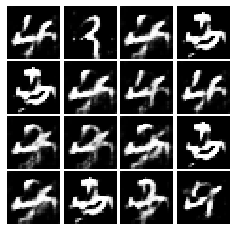

Epoch: 3, Iter: 1800, D: 0.8858, G:2.21


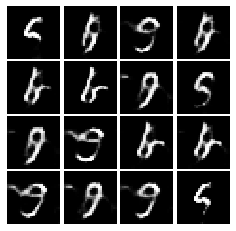

Epoch: 3, Iter: 1820, D: 0.324, G:4.43


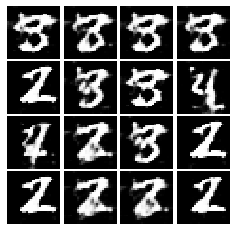

Epoch: 3, Iter: 1840, D: 0.1299, G:3.821


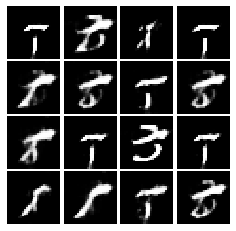

Epoch: 3, Iter: 1860, D: 0.4547, G:2.812


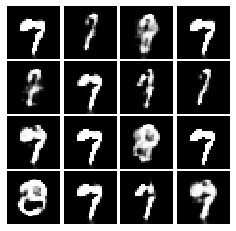

Epoch: 4, Iter: 1880, D: 0.5426, G:3.873


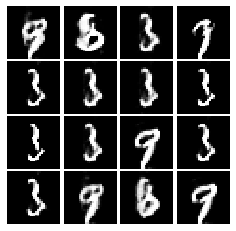

Epoch: 4, Iter: 1900, D: 0.1806, G:4.379


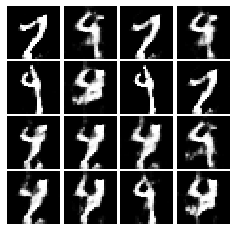

Epoch: 4, Iter: 1920, D: 0.2657, G:5.516


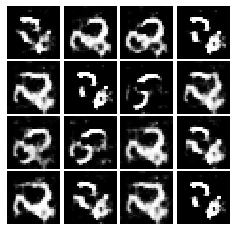

Epoch: 4, Iter: 1940, D: 0.8448, G:3.207


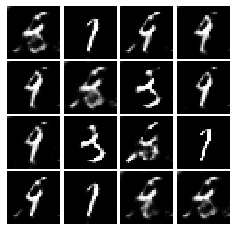

Epoch: 4, Iter: 1960, D: 0.3518, G:4.651


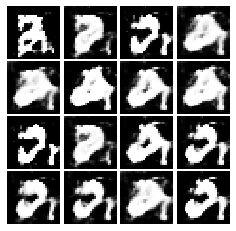

Epoch: 4, Iter: 1980, D: 0.2242, G:4.324


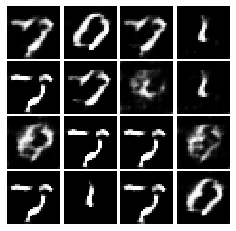

Epoch: 4, Iter: 2000, D: 0.916, G:1.354


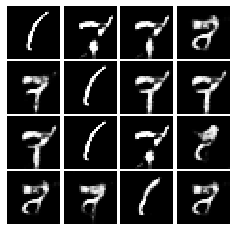

Epoch: 4, Iter: 2020, D: 0.3414, G:3.545


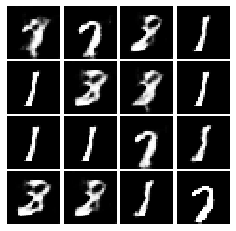

Epoch: 4, Iter: 2040, D: 0.4482, G:6.502


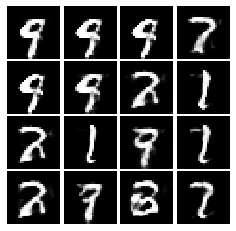

Epoch: 4, Iter: 2060, D: 0.2009, G:5.16


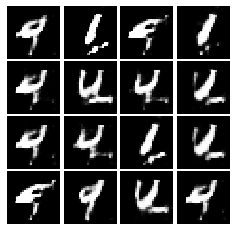

Epoch: 4, Iter: 2080, D: 0.1977, G:4.788


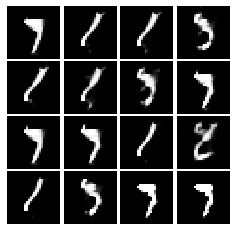

Epoch: 4, Iter: 2100, D: 0.2694, G:5.427


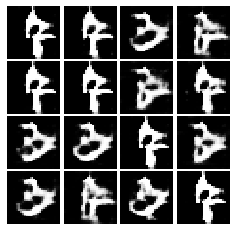

Epoch: 4, Iter: 2120, D: 0.6209, G:3.678


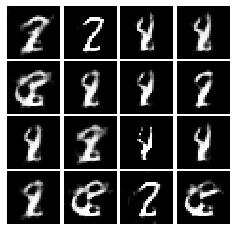

Epoch: 4, Iter: 2140, D: 0.4921, G:3.761


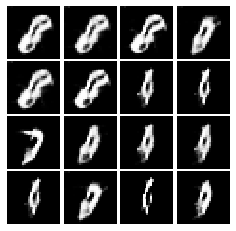

Epoch: 4, Iter: 2160, D: 0.6239, G:3.745


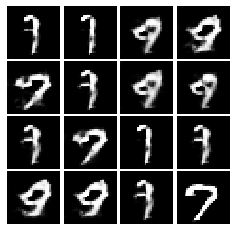

Epoch: 4, Iter: 2180, D: 0.1457, G:3.561


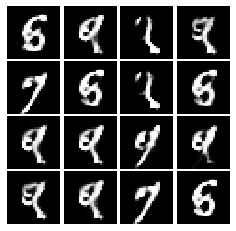

Epoch: 4, Iter: 2200, D: 0.4201, G:4.332


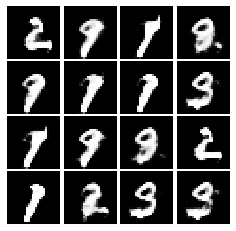

Epoch: 4, Iter: 2220, D: 0.1918, G:3.26


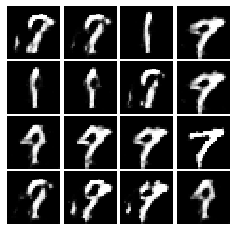

Epoch: 4, Iter: 2240, D: 0.3233, G:3.526


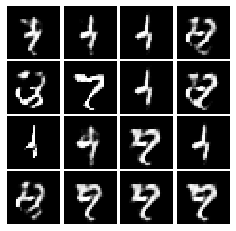

Epoch: 4, Iter: 2260, D: 0.569, G:3.507


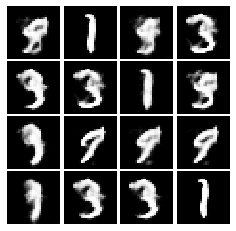

Epoch: 4, Iter: 2280, D: 0.2511, G:4.547


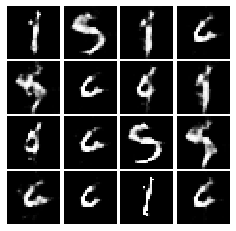

Epoch: 4, Iter: 2300, D: 0.1858, G:4.317


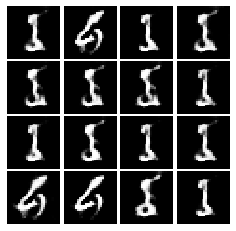

Epoch: 4, Iter: 2320, D: 0.2936, G:3.508


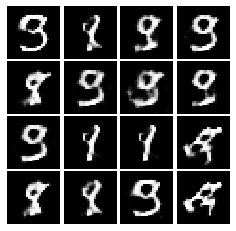

Epoch: 4, Iter: 2340, D: 0.3006, G:2.741


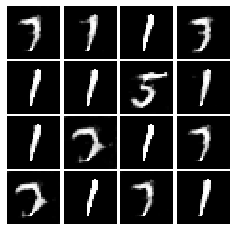

Final images


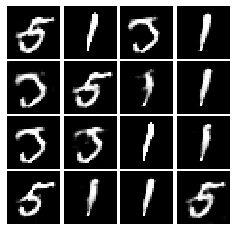

In [103]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
